In [1]:
# EDA
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import numpy as np
from tqdm import tqdm
import math

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import  CatBoostRegressor

# Learning algorithms
from sklearn.linear_model import *
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# model validation
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error as mse

import warnings
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width: 100% !important; }</style>"))

# 데이터 불러오기

In [2]:
train_df = pd.read_csv('./energy/train.csv', encoding='cp949')
test_df = pd.read_csv('./energy/test.csv', encoding='cp949')
sub_df = pd.read_csv('./energy/sample_submission.csv', encoding='cp949')

# '비전기냉방설비운영', '태양광보유' test 데이터 전처리

In [3]:
train_df.drop_duplicates(subset = ['num', '비전기냉방설비운영', '태양광보유']).dropna()

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
2040,2,2020-06-01 00,977.184,18.3,2.5,94.0,0.0,0.0,1.0,0.0
4080,3,2020-06-01 00,3183.624,17.0,2.0,100.0,1.1,0.0,1.0,1.0
6120,4,2020-06-01 00,339.552,22.6,0.7,62.0,0.0,0.0,1.0,1.0
8160,5,2020-06-01 00,3063.744,18.3,2.5,94.0,0.0,0.0,1.0,0.0
10200,6,2020-06-01 00,527.580,17.0,2.0,100.0,1.1,0.0,0.0,0.0
12240,7,2020-06-01 00,1313.658,17.6,2.5,92.0,0.8,0.0,1.0,0.0
14280,8,2020-06-01 00,4801.977,19.1,1.1,73.0,0.0,0.0,1.0,1.0
16320,9,2020-06-01 00,1255.932,20.3,1.1,74.0,0.0,0.0,0.0,1.0
18360,10,2020-06-01 00,417.960,18.3,2.5,94.0,0.0,0.0,1.0,0.0


In [4]:
sun = train_df.groupby('num')['태양광보유'].unique()
non_ele = train_df.groupby('num')['비전기냉방설비운영'].unique()

In [5]:
test_df['태양광보유'] = test_df['num'].map(sun).astype(int)
test_df['비전기냉방설비운영'] = test_df['num'].map(non_ele).astype(int)

# 컬럼명 변경

In [6]:
# renaming columns
train_df.columns = ['num','datetime','target','temperature','windspeed','humidity','precipitation','insolation','nelec_cool_flag','solar_flag']
test_df.columns = ['num','datetime','temperature','windspeed','humidity','precipitation','insolation','nelec_cool_flag','solar_flag']

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   num              122400 non-null  int64  
 1   datetime         122400 non-null  object 
 2   target           122400 non-null  float64
 3   temperature      122400 non-null  float64
 4   windspeed        122400 non-null  float64
 5   humidity         122400 non-null  float64
 6   precipitation    122400 non-null  float64
 7   insolation       122400 non-null  float64
 8   nelec_cool_flag  122400 non-null  float64
 9   solar_flag       122400 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 9.3+ MB


In [8]:
test_df.head()

,num,datetime,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag
0,1,2020-08-25 00,27.8,1.5,74.0,0.0,0.0,0,0
1,1,2020-08-25 01,NaN,NaN,NaN,NaN,NaN,0,0
2,1,2020-08-25 02,NaN,NaN,NaN,NaN,NaN,0,0
3,1,2020-08-25 03,27.3,1.1,78.0,NaN,0.0,0,0
4,1,2020-08-25 04,NaN,NaN,NaN,NaN,NaN,0,0


# 클러스터링

In [9]:
train_df['datetime'] = pd.to_datetime(train_df['datetime'])
train_df['weekday'] = train_df['datetime'].dt.weekday 
train_df['hour'] = train_df['datetime'].dt.hour

test_df['datetime'] = pd.to_datetime(test_df['datetime'])
test_df['weekday'] = test_df['datetime'].dt.weekday 
test_df['hour'] = test_df['datetime'].dt.hour

In [10]:
scaler = StandardScaler()

d_list = []
for i in range(1, 61):
    d = train_df[train_df['num'] == i].copy()
    d['target'] = scaler.fit_transform(d['target'].values.reshape(-1,1))
    d_ = d.groupby(['weekday', 'hour'])['target'].mean().unstack()
    d_list.append(d_.to_numpy())

# 정규화된 시간-요일별 전력사용량을 이미지처럼 저장
d_list = np.array(d_list)

In [11]:
d_list_ = d_list.reshape(60, -1)
model = KMeans(init="k-means++", n_clusters=4, random_state=0)
model.fit(d_list_)

KMeans(n_clusters=4, random_state=0)

In [12]:
cluster = model.labels_
pd.DataFrame(cluster).value_counts()

1    31
2    17
3     7
0     5
dtype: int64

In [13]:
cluster

array([0, 1, 0, 2, 0, 1, 1, 1, 0, 2, 2, 2, 1, 1, 0, 1, 1, 1, 3, 3, 3, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 3, 1, 2, 1, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 2, 2])

In [14]:
cluster_map = {i+1 : c for i, c in enumerate(cluster)}
train_df['cluster'] = train_df['num'].map(cluster_map)
test_df['cluster'] = test_df['num'].map(cluster_map)

In [15]:
# dictionary mapping cluster and building
match = train_df[['num','cluster']]
clust_to_num = {0:[],1:[],2:[],3:[]}
for i in range(60):
    c = cluster[i]
    clust_to_num[c].append(i+1)

In [16]:
clust_to_num

{0: [1, 3, 5, 9, 15],
 1: [2,
  6,
  7,
  8,
  13,
  14,
  16,
  17,
  18,
  22,
  23,
  24,
  25,
  26,
  27,
  33,
  35,
  37,
  43,
  44,
  45,
  46,
  47,
  48,
  52,
  53,
  54,
  55,
  56,
  57,
  58],
 2: [4, 10, 11, 12, 28, 29, 30, 31, 32, 36, 38, 39, 40, 41, 42, 59, 60],
 3: [19, 20, 21, 34, 49, 50, 51]}

# feature engineering

In [17]:
def get_pow(series):
    return math.pow(series, 0.15)

In [18]:
def train_preprocess(train):
    X_train = train.copy()
    
    # 날짜 관련 변수 전처리 및 변수 생성
    X_train['month'] = X_train['datetime'].dt.month
    X_train['day'] = X_train['datetime'].dt.day
    X_train['date'] = X_train['datetime'].dt.date
    X_train['dayofyear'] = X_train['datetime'].dt.dayofyear
    X_train['weekend'] = X_train['weekday'].apply(lambda x: 0 if x < 5 else 1)
    
#     X_train.loc[X_train.weekday >= 5, 'holiday'] = 1
#     X_train.loc[X_train.weekday < 5, 'holiday'] = 0
    X_train.loc[(X_train.month == 8) & (X_train.day == 17), 'weekend'] = 1
    
    X_train['date_num'] = X_train['month'] + X_train['day']/31
    X_train['date_num2'] = X_train['month'] + X_train['day']/7
    X_train['date_num3'] = X_train['month'] + X_train['dayofyear']
    X_train['date_num4'] = X_train['month'] + X_train['hour']/24
    X_train['date_num5'] = X_train['weekday'] + X_train['hour']/24
    X_train['date_num6'] = X_train['dayofyear'] + X_train['hour']/24
    X_train['date_num7'] = X_train['weekend'] + X_train['hour']/24
    
    # 체감온도와 불쾌지수 추가
    X_train['perceived_temperature'] = 13.12 + 0.6215*X_train['temperature'] - 11.37*X_train['windspeed'].apply(get_pow) + 0.3965*X_train['windspeed'].apply(get_pow)*X_train['temperature']
    X_train['discomfort_index'] = 1.8*X_train['temperature'] - 0.55*(1-X_train['humidity'])*(1.8*X_train['temperature']-26) + 32
    
    # 코로나 거리두기 단계 추가
    corona=[]
    for m,d in zip(X_train['month'], X_train['day']):
        if m==8 and d>=16:
            corona.append(2)
        else:
            corona.append(1)
    X_train['corona'] = corona
    
    # 건물별 날짜별 통계값 변수 추가
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].min().reset_index().rename(columns = {'temperature':'min_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].max().reset_index().rename(columns = {'temperature':'max_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].mean().reset_index().rename(columns = {'temperature':'mean_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['humidity'].mean().reset_index().rename(columns = {'humidity':'mean_humidity'}), on = ['num','date'], how = 'left')
            
    # 클러스터 그룹 및 건물별 특징 변수 추가
    X_trains = [X_train[X_train.num == num] for num in range(1,61,1)]
    for num in clust_to_num[1]:
#         if num in [43, 44, 58]:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
#             X_trains[num-1] = temp_df
#         if num == 45:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12,13,14,15,16,17]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12]))&(temp_df['weekday'].isin([5]))).astype(int)
#             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             X_trains[num-1] = temp_df
        if num in [7, 18, 27, 43, 44, 54, 55, 57, 58, 45]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
            #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
            X_trains[num-1] = temp_df
    for num in clust_to_num[2]:
        if num in [28, 30, 32, 39, 42, 59, 60]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
            X_trains[num-1] = temp_df
#     for num in clust_to_num[3]:
#         temp_df = X_trains[num-1]
#         temp_df['working_time'] = ((temp_df['hour'].isin([18,19,20,21,22]))).astype(int)
#         X_trains[num-1] = temp_df

    y_trains = [df['target'].values for df in X_trains]
    X_trains = [df.drop('target', axis = 1) for df in X_trains]

    # drop unnecessary columns
    X_trains = [df.drop(['datetime', 'date', 'day'], axis=1).reset_index().drop('index', axis=1) for df in X_trains]
    # standard scaling on numerical features
    num_features = ['temperature', 'windspeed', 'humidity', 'precipitation', 'insolation', 'perceived_temperature', 'discomfort_index', 'min_temperature', 'max_temperature', 
                    'mean_temperature', 'mean_humidity']

    means = []
    stds = []
    for i, df in enumerate(X_trains):
        means.append(df.loc[:,num_features].mean(axis=0))
        stds.append(df.loc[:,num_features].std(axis=0))
        df.loc[:,num_features] = (df.loc[:,num_features] - df.loc[:,num_features].mean(axis=0))/df.loc[:,num_features].std(axis=0)
        X_trains[i] = df
        
    return X_trains, y_trains, means, stds

In [19]:
def test_preprocess(test, means, stds):

    X_train = test.copy()
    # 결측치 선형보간
    X_train = X_train.interpolate(method='values').round(1)
    
    # 날짜 관련 변수 전처리 및 변수 생성
    X_train['month'] = X_train['datetime'].dt.month
    X_train['day'] = X_train['datetime'].dt.day
    X_train['date'] = X_train['datetime'].dt.date
    X_train['dayofyear'] = X_train['datetime'].dt.dayofyear
    X_train['weekend'] = X_train['weekday'].apply(lambda x: 0 if x < 5 else 1)
    
#     X_train.loc[X_train.weekday >= 5, 'holiday'] = 1
#     X_train.loc[X_train.weekday < 5, 'holiday'] = 0
    X_train.loc[(X_train.month == 8) & (X_train.day == 17), 'weekend'] = 1
    
    X_train['date_num'] = X_train['month'] + X_train['day']/31
    X_train['date_num2'] = X_train['month'] + X_train['day']/7
    X_train['date_num3'] = X_train['month'] + X_train['dayofyear']
    X_train['date_num4'] = X_train['month'] + X_train['hour']/24
    X_train['date_num5'] = X_train['weekday'] + X_train['hour']/24
    X_train['date_num6'] = X_train['dayofyear'] + X_train['hour']/24
    X_train['date_num7'] = X_train['weekend'] + X_train['hour']/24
    
    X_train['perceived_temperature'] = 13.12 + 0.6215*X_train['temperature'] - 11.37*X_train['windspeed'].apply(get_pow) + 0.3965*X_train['windspeed'].apply(get_pow)*X_train['temperature']
    X_train['discomfort_index'] = 1.8*X_train['temperature'] - 0.55*(1-X_train['humidity'])*(1.8*X_train['temperature']-26) + 32
    
    # 체감온도와 불쾌지수 추가
    corona2=[]
    for i in range(len(X_train)):
        corona2.append(2)
    X_train['corona'] = corona2
    
    # 건물별 날짜별 통계값 변수 추가
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].min().reset_index().rename(columns = {'temperature':'min_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].max().reset_index().rename(columns = {'temperature':'max_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].mean().reset_index().rename(columns = {'temperature':'mean_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['humidity'].mean().reset_index().rename(columns = {'humidity':'mean_humidity'}), on = ['num','date'], how = 'left')

            
    # 클러스터 그룹 및 건물별 특징 변수 추가
    X_trains = [X_train[X_train.num == num] for num in range(1,61,1)]
    for num in clust_to_num[1]:
#         if num in [43, 44, 58]:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
#             X_trains[num-1] = temp_df
#         if num == 45:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12,13,14,15,16,17]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12]))&(temp_df['weekday'].isin([5]))).astype(int)
#             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             X_trains[num-1] = temp_df
        if num in [7, 18, 27, 43, 44, 54, 55, 57, 58, 45]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
            #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
            X_trains[num-1] = temp_df
    for num in clust_to_num[2]:
        if num in [28, 30, 32, 39, 42, 59, 60]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
            X_trains[num-1] = temp_df
#     for num in clust_to_num[3]:
#         temp_df = X_trains[num-1]
#         temp_df['working_time'] = ((temp_df['hour'].isin([18,19,20,21,22]))).astype(int)
#         X_trains[num-1] = temp_df

    # drop unnecessary columns
    X_trains = [df.drop(['datetime', 'date', 'day'], axis=1).reset_index().drop('index', axis=1) for df in X_trains]
    # standard scaling on numerical features
    num_features = ['temperature', 'windspeed', 'humidity', 'precipitation', 'insolation', 'perceived_temperature', 'discomfort_index', 'min_temperature', 'max_temperature', 
                    'mean_temperature', 'mean_humidity']
    
    for i, (df, mean, std) in enumerate(zip(X_trains, means, stds)):
        df.loc[:,num_features] = (df.loc[:,num_features] - mean) / std
        X_trains[i] = df
        
    return X_trains

In [20]:
X_trains, y_trains, means, stds = train_preprocess(train_df)
X_tests = test_preprocess(test_df, means, stds)

In [21]:
y_trains[0]

array([8179.056, 8135.64 , 8107.128, ..., 8730.504, 8725.968, 8705.232])

In [22]:
X_trains[0]

,num,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag,weekday,hour,...,date_num5,date_num6,date_num7,perceived_temperature,discomfort_index,corona,min_temperature,max_temperature,mean_temperature,mean_humidity
0,1,-2.144783,0.138604,1.021261,0.132565,-0.537398,0.0,0.0,0,0,...,0.000000,153.000000,0.000000,-2.187964,-2.098118,1,-2.096415,-1.471290,-2.271350,-0.923134
1,1,-2.114181,0.498568,0.957546,-0.083954,-0.537398,0.0,0.0,0,1,...,0.041667,153.041667,0.041667,-2.189334,-2.070659,1,-2.096415,-1.471290,-2.271350,-0.923134
2,1,-2.175385,0.768541,0.957546,-0.213865,-0.537398,0.0,0.0,0,2,...,0.083333,153.083333,0.083333,-2.273994,-2.154335,1,-2.096415,-1.471290,-2.271350,-0.923134
3,1,-2.297795,0.768541,0.957546,-0.213865,-0.537398,0.0,0.0,0,3,...,0.125000,153.125000,0.125000,-2.399672,-2.321689,1,-2.096415,-1.471290,-2.271350,-0.923134
4,1,-2.328397,0.858532,1.021261,-0.213865,-0.537398,0.0,0.0,0,4,...,0.166667,153.166667,0.166667,-2.438418,-2.351882,1,-2.096415,-1.471290,-2.271350,-0.923134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2035,1,1.466283,0.948523,-0.635345,-0.213865,0.044807,0.0,0.0,0,19,...,0.791667,237.791667,0.791667,1.465823,1.120746,2,0.887716,1.142556,1.391609,-0.329910
2036,1,1.252067,-0.401342,-0.444198,-0.213865,-0.537398,0.0,0.0,0,20,...,0.833333,237.833333,0.833333,1.244743,1.102492,2,0.887716,1.142556,1.391609,-0.329910
2037,1,1.129658,-1.121270,-0.316767,-0.213865,-0.537398,0.0,0.0,0,21,...,0.875000,237.875000,0.875000,1.126857,1.101507,2,0.887716,1.142556,1.391609,-0.329910
2038,1,1.129658,0.048613,-0.253051,-0.213865,-0.537398,0.0,0.0,0,22,...,0.916667,237.916667,0.916667,1.121464,1.164642,2,0.887716,1.142556,1.391609,-0.329910


In [23]:
X_trains[0].isna().sum()

num                      0
temperature              0
windspeed                0
humidity                 0
precipitation            0
insolation               0
nelec_cool_flag          0
solar_flag               0
weekday                  0
hour                     0
cluster                  0
month                    0
dayofyear                0
weekend                  0
date_num                 0
date_num2                0
date_num3                0
date_num4                0
date_num5                0
date_num6                0
date_num7                0
perceived_temperature    0
discomfort_index         0
corona                   0
min_temperature          0
max_temperature          0
mean_temperature         0
mean_humidity            0
dtype: int64

In [24]:
X_tests[0]

,num,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag,weekday,hour,...,date_num5,date_num6,date_num7,perceived_temperature,discomfort_index,corona,min_temperature,max_temperature,mean_temperature,mean_humidity
0,1,0.976647,-0.761306,-0.125620,-0.213865,-0.537398,0,0,1,0,...,1.000000,238.000000,0.000000,0.974977,1.120452,2,1.910847,2.210183,2.467666,-0.569344
1,1,0.915443,-0.851297,-0.042789,-0.213865,-0.537398,0,0,1,1,...,1.041667,238.041667,0.041667,0.916393,1.130197,2,1.910847,2.210183,2.467666,-0.569344
2,1,0.884840,-1.031279,0.046412,-0.213865,-0.537398,0,0,1,2,...,1.083333,238.083333,0.083333,0.889776,1.178798,2,1.910847,2.210183,2.467666,-0.569344
3,1,0.823636,-1.121270,0.129243,-0.213865,-0.537398,0,0,1,3,...,1.125000,238.125000,0.125000,0.832737,1.184305,2,1.910847,2.210183,2.467666,-0.569344
4,1,0.701227,-1.031279,0.237559,-0.213865,-0.537398,0,0,1,4,...,1.166667,238.166667,0.166667,0.712393,1.137131,2,1.910847,2.210183,2.467666,-0.569344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,1,1.099056,0.408577,-0.208450,-0.213865,1.791421,0,0,0,19,...,0.791667,244.791667,0.791667,1.089172,1.175337,2,0.972977,0.295817,0.809903,0.277609
164,1,0.946045,0.228595,-0.170221,-0.213865,0.627012,0,0,0,20,...,0.833333,244.833333,0.833333,0.934853,1.044079,2,0.972977,0.295817,0.809903,0.277609
165,1,0.762431,0.048613,-0.125620,-0.213865,-0.537398,0,0,0,21,...,0.875000,244.875000,0.875000,0.751305,0.881808,2,0.972977,0.295817,0.809903,0.277609
166,1,0.731829,-0.401342,0.148357,-0.213865,-0.537398,0,0,0,22,...,0.916667,244.916667,0.916667,0.727955,1.093724,2,0.972977,0.295817,0.809903,0.277609


In [25]:
X_tests[0].isna().sum()

num                      0
temperature              0
windspeed                0
humidity                 0
precipitation            0
insolation               0
nelec_cool_flag          0
solar_flag               0
weekday                  0
hour                     0
cluster                  0
month                    0
dayofyear                0
weekend                  0
date_num                 0
date_num2                0
date_num3                0
date_num4                0
date_num5                0
date_num6                0
date_num7                0
perceived_temperature    0
discomfort_index         0
corona                   0
min_temperature          0
max_temperature          0
mean_temperature         0
mean_humidity            0
dtype: int64

# 모델 정의 및 학습

In [26]:
# metric
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred)))*100

# customized k-fold CV class for scikit-learn model
class CV_sklearn():
    def __init__(self, models, n_folds = 10):
        '''
        models : list of 8 models
        n_folds : int
        '''
        self.models = models
        self.n_folds = n_folds
    
    def cv_score(self, X_trains, y_trains, X_tests, verbose = 0, perm_imp = False, feat_imp = False):
        '''
        X_trains : list of 60 dataframes
        y_trains : list of 60 series
        '''
        trues = [[],[],[],[],[],[],[],[],[],[]]
        preds = [[],[],[],[],[],[],[],[],[],[]]
        permutation_importances = [[],[],[],[],[],[],[],[]]
        feature_importances = [[],[],[],[],[],[],[],[]]
        
#         sub = [[],[],[],[],[],[],[],[],[],[]]
        sub = []
        
        # for each building
        for i, (X_train, y_train, X_test) in enumerate(zip(X_trains, y_trains, X_tests)):
            
            kfold = KFold(n_splits=self.n_folds, shuffle = True,random_state=55)
            print(f"\n\n**************************************{i+1}************************************************")
            
            # for each fold
            each_sub = np.zeros((X_test.shape[0]))
            outcomes=[]
            print(X_test.shape, X_train.shape, kfold.n_splits)
            for j, (tr_idx, val_idx) in enumerate(kfold.split(X_train, y_train)):
                print(f'===================================={i+1}_{j+1}============================================')
                X_tr, X_val = X_train.iloc[tr_idx,:], X_train.iloc[val_idx,:]
                y_tr, y_val = y_train[tr_idx], y_train[val_idx]
                
                # fit model on each fold
                temp_model = self.models[j][i]
                temp_model.fit(X_tr, y_tr, eval_set=[(X_tr, y_tr),(X_val, y_val)], early_stopping_rounds= 50, verbose = 100)
#                 if perm_imp:
#                     r = permutation_importance(temp_model, X_val, y_val, n_repeats=10, scoring=smape, random_state=2)
#                     permutation_importances[j].append(r['importances_mean'])
#                 if feat_imp:
#                     feature_importances[j].append(temp_model.feature_importances_)
                self.models[j][i] = temp_model
                pred = temp_model.predict(X_val)
                test_pred = temp_model.predict(X_test)
                true = y_val
                preds[j].append(pred)
                trues[j].append(true)
#                 sub[j].append(test_pred)
                each_sub+=test_pred
                val_mse = mse(true, pred)
                outcomes.append(val_mse)
                print(f'================================================================================\n\n')
            
            sub.append(each_sub/kfold.n_splits)
            mean_outcome=np.mean(outcomes)
            print("NUM:{}_Mean:{}".format(i+1, mean_outcome))
            
            if (verbose == 1)&((i+1)%5==0) :
                print(f'{i+1}th model complete')

        scores = []
        for true, pred in zip(trues, preds):
            true_f = np.concatenate(true)
            pred_f = np.concatenate(pred)
            scores.append(SMAPE(true_f, pred_f))

        self.trues = trues
        self.preds = preds
#         self.permutation_importances = permutation_importances
#         self.feature_importanc

        return scores, sub

In [27]:
# lr_models = [[XGBRegressor(n_estimators = 10000, learning_rate=0.01, max_depth=10, random_seed=777) for i in range(60)] for j in range(10)]
# cv_lr = CV_sklearn(lr_models, n_folds = 10)
# scores_lr, sub = cv_lr.cv_score(X_trains, y_trains, X_tests, verbose = 1)
# print(np.mean(scores_lr))

In [28]:
lr_models = [[XGBRegressor(n_estimators = 10000, learning_rate=0.01, max_depth=10, random_seed=123) for i in range(60)] for j in range(10)]
cv_lr = CV_sklearn(lr_models, n_folds = 10)
scores_lr, sub = cv_lr.cv_score(X_trains, y_trains, X_tests, verbose = 1)
print(np.mean(scores_lr))



**************************************1************************************************
(168, 28) (2040, 28) 10
====================================1_1============================================
[19:24:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:8459.05664	validation_1-rmse:8452.36719
[100]	validation_0-rmse:3100.15186	validation_1-rmse:3092.75855
[200]	validation_0-rmse:1138.30884	validation_1-rmse:1131.62830
[300]	validation_0-rmse:420.45636	validation_1-rmse:415.53146
[400]	validation_0-rmse:157.97052	validation_1-rmse:155.00272
[500]	validation_0-rmse:61.98933	validation_1-rmse:61.85292
[600]	validation_0-rmse:26.60848	valida

[1800]	validation_0-rmse:1.75639	validation_1-rmse:17.51858
[1900]	validation_0-rmse:1.48792	validation_1-rmse:17.49544
[2000]	validation_0-rmse:1.24892	validation_1-rmse:17.46309
[2100]	validation_0-rmse:1.12143	validation_1-rmse:17.45343
[2200]	validation_0-rmse:1.01418	validation_1-rmse:17.43998
[2300]	validation_0-rmse:0.89163	validation_1-rmse:17.42935
[2340]	validation_0-rmse:0.84143	validation_1-rmse:17.43380


====================================1_6============================================
[19:24:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:8459.08496	validation_1-rmse:8452.10352
[100]	validation_0-rmse:3100.13355	validati

[100]	validation_0-rmse:492.51498	validation_1-rmse:492.12906
[200]	validation_0-rmse:186.07036	validation_1-rmse:185.68985
[300]	validation_0-rmse:74.09242	validation_1-rmse:77.39226
[400]	validation_0-rmse:32.47323	validation_1-rmse:43.50591
[500]	validation_0-rmse:16.06654	validation_1-rmse:34.65306
[600]	validation_0-rmse:9.31202	validation_1-rmse:32.58287
[700]	validation_0-rmse:6.42159	validation_1-rmse:31.95591
[800]	validation_0-rmse:5.04202	validation_1-rmse:31.70555
[900]	validation_0-rmse:4.26544	validation_1-rmse:31.59329
[1000]	validation_0-rmse:3.63397	validation_1-rmse:31.50941
[1100]	validation_0-rmse:3.08130	validation_1-rmse:31.46362
[1200]	validation_0-rmse:2.73750	validation_1-rmse:31.45065
[1300]	validation_0-rmse:2.44205	validation_1-rmse:31.42204
[1372]	validation_0-rmse:2.26292	validation_1-rmse:31.41738


====================================2_2============================================
[19:25:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release

[200]	validation_0-rmse:185.92876	validation_1-rmse:188.76465
[300]	validation_0-rmse:74.05394	validation_1-rmse:78.82804
[400]	validation_0-rmse:32.49941	validation_1-rmse:43.41563
[500]	validation_0-rmse:16.44937	validation_1-rmse:34.29600
[600]	validation_0-rmse:9.59154	validation_1-rmse:31.86469
[700]	validation_0-rmse:6.58879	validation_1-rmse:31.19639
[800]	validation_0-rmse:5.07063	validation_1-rmse:30.87645
[900]	validation_0-rmse:4.12100	validation_1-rmse:30.73074
[1000]	validation_0-rmse:3.63620	validation_1-rmse:30.67523
[1100]	validation_0-rmse:3.26432	validation_1-rmse:30.64788
[1200]	validation_0-rmse:2.90191	validation_1-rmse:30.62001
[1300]	validation_0-rmse:2.51520	validation_1-rmse:30.57106
[1400]	validation_0-rmse:2.20140	validation_1-rmse:30.54027
[1500]	validation_0-rmse:1.96975	validation_1-rmse:30.50703
[1600]	validation_0-rmse:1.76918	validation_1-rmse:30.49442
[1631]	validation_0-rmse:1.72205	validation_1-rmse:30.49333


====================================2_8=

[300]	validation_0-rmse:176.65099	validation_1-rmse:183.04723
[400]	validation_0-rmse:71.67375	validation_1-rmse:86.47527
[500]	validation_0-rmse:33.21198	validation_1-rmse:60.61321
[600]	validation_0-rmse:18.56166	validation_1-rmse:54.59719
[700]	validation_0-rmse:12.41125	validation_1-rmse:53.89662
[800]	validation_0-rmse:9.72671	validation_1-rmse:53.76857
[806]	validation_0-rmse:9.58455	validation_1-rmse:53.78980


====================================3_3============================================
[19:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:3342.96802	validation_1-rmse:3331.43286
[100]	validation_0-rmse:1231.52954	validati

[1326]	validation_0-rmse:3.98657	validation_1-rmse:43.15412


====================================3_9============================================
[19:26:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:3341.80542	validation_1-rmse:3342.11499
[100]	validation_0-rmse:1231.16162	validation_1-rmse:1233.01001
[200]	validation_0-rmse:461.21225	validation_1-rmse:465.05972
[300]	validation_0-rmse:176.58295	validation_1-rmse:189.77948
[400]	validation_0-rmse:71.42485	validation_1-rmse:102.05515
[500]	validation_0-rmse:32.28468	validation_1-rmse:80.94647
[600]	validation_0-rmse:17.81379	validation_1-rmse:76.57909
[700]	validation_0-rmse:12.01517	v

[200]	validation_0-rmse:151.33289	validation_1-rmse:194.84390
[300]	validation_0-rmse:70.62645	validation_1-rmse:138.34712
[400]	validation_0-rmse:37.20902	validation_1-rmse:122.95464
[500]	validation_0-rmse:22.21598	validation_1-rmse:118.65547
[600]	validation_0-rmse:15.04491	validation_1-rmse:117.30336
[700]	validation_0-rmse:11.46164	validation_1-rmse:116.69022
[800]	validation_0-rmse:9.24954	validation_1-rmse:116.38502
[900]	validation_0-rmse:8.06144	validation_1-rmse:116.29001
[1000]	validation_0-rmse:7.13447	validation_1-rmse:116.22586
[1078]	validation_0-rmse:6.65116	validation_1-rmse:116.20946


====================================4_6============================================
[19:26:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used bu

[1200]	validation_0-rmse:12.23686	validation_1-rmse:109.53253
[1300]	validation_0-rmse:10.41560	validation_1-rmse:109.14510
[1400]	validation_0-rmse:9.29558	validation_1-rmse:108.72813
[1500]	validation_0-rmse:7.95686	validation_1-rmse:108.37251
[1600]	validation_0-rmse:6.93812	validation_1-rmse:108.22464
[1700]	validation_0-rmse:6.04414	validation_1-rmse:107.97164
[1800]	validation_0-rmse:5.11224	validation_1-rmse:107.75585
[1900]	validation_0-rmse:4.57195	validation_1-rmse:107.68813
[2000]	validation_0-rmse:4.18462	validation_1-rmse:107.63734
[2100]	validation_0-rmse:3.67997	validation_1-rmse:107.53786
[2200]	validation_0-rmse:3.38564	validation_1-rmse:107.46742
[2300]	validation_0-rmse:3.12902	validation_1-rmse:107.41457
[2400]	validation_0-rmse:2.83312	validation_1-rmse:107.35557
[2500]	validation_0-rmse:2.47873	validation_1-rmse:107.28681
[2600]	validation_0-rmse:2.16628	validation_1-rmse:107.24361
[2700]	validation_0-rmse:1.96083	validation_1-rmse:107.21166
[2800]	validation_0-rm

[1100]	validation_0-rmse:16.35217	validation_1-rmse:109.96914
[1198]	validation_0-rmse:14.21300	validation_1-rmse:109.86733


====================================5_6============================================
[19:27:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2717.62329	validation_1-rmse:2713.52344
[100]	validation_0-rmse:1024.67664	validation_1-rmse:1015.34436
[200]	validation_0-rmse:404.48672	validation_1-rmse:396.94168
[300]	validation_0-rmse:172.27745	validation_1-rmse:189.91377
[400]	validation_0-rmse:83.85774	validation_1-rmse:131.97464
[500]	validation_0-rmse:50.43388	validation_1-rmse:119.50703
[600]	validation_0-rmse:35.85

[1730]	validation_0-rmse:5.96836	validation_1-rmse:112.97362


====================================5_10============================================
[19:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2722.02002	validation_1-rmse:2673.42358
[100]	validation_0-rmse:1026.26367	validation_1-rmse:996.83832
[200]	validation_0-rmse:405.39899	validation_1-rmse:393.06992
[300]	validation_0-rmse:172.42360	validation_1-rmse:180.48370
[400]	validation_0-rmse:83.70465	validation_1-rmse:116.46618
[500]	validation_0-rmse:49.47837	validation_1-rmse:103.50657
[600]	validation_0-rmse:35.14886	validation_1-rmse:101.05882
[700]	validation_0-rmse:27.4362

[1000]	validation_0-rmse:2.54612	validation_1-rmse:36.14470
[1100]	validation_0-rmse:2.17555	validation_1-rmse:36.04810
[1200]	validation_0-rmse:1.87274	validation_1-rmse:35.99888
[1300]	validation_0-rmse:1.65936	validation_1-rmse:35.96507
[1388]	validation_0-rmse:1.50808	validation_1-rmse:35.95954


====================================6_4============================================
[19:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1388.81494	validation_1-rmse:1302.44153
[100]	validation_0-rmse:520.03857	validation_1-rmse:483.80197
[200]	validation_0-rmse:200.31766	validation_1-rmse:188.80337
[300]	validation_0-rmse:81.22384	valida

[1500]	validation_0-rmse:1.46775	validation_1-rmse:42.08005
[1600]	validation_0-rmse:1.30511	validation_1-rmse:42.07268
[1700]	validation_0-rmse:1.14943	validation_1-rmse:42.06095
[1732]	validation_0-rmse:1.10247	validation_1-rmse:42.05980


====================================6_9============================================
[19:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1387.30249	validation_1-rmse:1316.97375
[100]	validation_0-rmse:519.49145	validation_1-rmse:490.01126
[200]	validation_0-rmse:199.94804	validation_1-rmse:189.62877
[300]	validation_0-rmse:81.01849	validation_1-rmse:85.72928
[400]	validation_0-rmse:35.34816	valida

[1174]	validation_0-rmse:4.72001	validation_1-rmse:75.22156


====================================7_4============================================
[19:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1631.98206	validation_1-rmse:1570.05456
[100]	validation_0-rmse:610.03418	validation_1-rmse:584.61713
[200]	validation_0-rmse:235.83650	validation_1-rmse:232.11200
[300]	validation_0-rmse:97.73547	validation_1-rmse:120.04642
[400]	validation_0-rmse:44.23917	validation_1-rmse:91.60544
[500]	validation_0-rmse:22.51760	validation_1-rmse:85.02095
[600]	validation_0-rmse:13.34086	validation_1-rmse:83.62878
[700]	validation_0-rmse:9.16698	valida

[100]	validation_0-rmse:610.63599	validation_1-rmse:580.68073
[200]	validation_0-rmse:236.15540	validation_1-rmse:229.80455
[300]	validation_0-rmse:97.68833	validation_1-rmse:117.20399
[400]	validation_0-rmse:44.06165	validation_1-rmse:87.55150
[500]	validation_0-rmse:22.67339	validation_1-rmse:81.28092
[600]	validation_0-rmse:13.82095	validation_1-rmse:79.85919
[700]	validation_0-rmse:9.94442	validation_1-rmse:79.52595
[800]	validation_0-rmse:7.90293	validation_1-rmse:78.98973
[900]	validation_0-rmse:6.41284	validation_1-rmse:78.74916
[1000]	validation_0-rmse:5.46499	validation_1-rmse:78.71488
[1026]	validation_0-rmse:5.28266	validation_1-rmse:78.74672


====================================7_10============================================
[19:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed dow

[1200]	validation_0-rmse:28.97636	validation_1-rmse:334.02954
[1300]	validation_0-rmse:25.22884	validation_1-rmse:333.52933
[1400]	validation_0-rmse:22.36865	validation_1-rmse:333.06775
[1500]	validation_0-rmse:19.52148	validation_1-rmse:332.59250
[1600]	validation_0-rmse:16.94593	validation_1-rmse:332.22421
[1700]	validation_0-rmse:15.41917	validation_1-rmse:332.04715
[1800]	validation_0-rmse:13.84585	validation_1-rmse:331.91922
[1900]	validation_0-rmse:12.69310	validation_1-rmse:331.79102
[2000]	validation_0-rmse:11.46520	validation_1-rmse:331.59915
[2100]	validation_0-rmse:9.89959	validation_1-rmse:331.38055
[2200]	validation_0-rmse:8.59424	validation_1-rmse:331.13702
[2300]	validation_0-rmse:7.63699	validation_1-rmse:331.00473
[2400]	validation_0-rmse:6.95658	validation_1-rmse:330.90128
[2500]	validation_0-rmse:6.23580	validation_1-rmse:330.86734
[2522]	validation_0-rmse:6.08085	validation_1-rmse:330.87872


====================================8_5===================================

[100]	validation_0-rmse:3608.25513	validation_1-rmse:3402.81445
[200]	validation_0-rmse:1387.39453	validation_1-rmse:1294.56531
[300]	validation_0-rmse:564.29053	validation_1-rmse:572.11389
[400]	validation_0-rmse:253.51605	validation_1-rmse:386.77853
[500]	validation_0-rmse:132.45232	validation_1-rmse:359.64621
[600]	validation_0-rmse:83.17825	validation_1-rmse:356.02447
[617]	validation_0-rmse:77.93991	validation_1-rmse:356.39493


====================================8_10============================================
[19:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:9658.15820	validation_1-rmse:9157.49707
[100]	validation_0-rmse:36



====================================9_5============================================
[19:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1246.23267	validation_1-rmse:1240.23669
[100]	validation_0-rmse:459.37286	validation_1-rmse:456.07684
[200]	validation_0-rmse:172.14906	validation_1-rmse:171.97449
[300]	validation_0-rmse:66.90968	validation_1-rmse:70.42970
[400]	validation_0-rmse:28.42162	validation_1-rmse:35.72517
[500]	validation_0-rmse:14.54038	validation_1-rmse:25.06854
[600]	validation_0-rmse:9.74015	validation_1-rmse:22.29280
[700]	validation_0-rmse:7.25022	validation_1-rmse:21.51643
[800]	validation_0-rmse:5.77777	validatio

[1234]	validation_0-rmse:3.08317	validation_1-rmse:17.75069


====================================9_10============================================
[19:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1246.15112	validation_1-rmse:1240.92029
[100]	validation_0-rmse:459.34076	validation_1-rmse:455.17084
[200]	validation_0-rmse:172.06915	validation_1-rmse:170.83138
[300]	validation_0-rmse:66.83717	validation_1-rmse:68.66195
[400]	validation_0-rmse:28.60590	validation_1-rmse:35.87769
[500]	validation_0-rmse:14.94793	validation_1-rmse:27.44006
[600]	validation_0-rmse:9.31522	validation_1-rmse:24.64835
[700]	validation_0-rmse:7.11860	validat

[1100]	validation_0-rmse:4.42575	validation_1-rmse:131.12564
[1200]	validation_0-rmse:3.91840	validation_1-rmse:131.06093
[1300]	validation_0-rmse:3.49357	validation_1-rmse:131.00095
[1400]	validation_0-rmse:3.08456	validation_1-rmse:130.96074
[1500]	validation_0-rmse:2.70024	validation_1-rmse:130.94569
[1600]	validation_0-rmse:2.39963	validation_1-rmse:130.91566
[1678]	validation_0-rmse:2.22147	validation_1-rmse:130.93356


====================================10_6============================================
[19:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1739.58521	validation_1-rmse:1777.10559
[100]	validation_0-rmse:650.84424	v

[400]	validation_0-rmse:75.90198	validation_1-rmse:114.14259
[500]	validation_0-rmse:39.89634	validation_1-rmse:98.54394
[600]	validation_0-rmse:25.31733	validation_1-rmse:93.82518
[700]	validation_0-rmse:18.16122	validation_1-rmse:92.73679
[800]	validation_0-rmse:13.68221	validation_1-rmse:91.93079
[900]	validation_0-rmse:11.48993	validation_1-rmse:91.72353
[1000]	validation_0-rmse:9.90404	validation_1-rmse:91.63500
[1100]	validation_0-rmse:8.25050	validation_1-rmse:91.50515
[1200]	validation_0-rmse:6.79266	validation_1-rmse:91.42436
[1300]	validation_0-rmse:5.81622	validation_1-rmse:91.41766
[1302]	validation_0-rmse:5.79891	validation_1-rmse:91.42234


====================================11_2============================================
[19:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down

[1100]	validation_0-rmse:8.39901	validation_1-rmse:87.58364
[1200]	validation_0-rmse:7.37140	validation_1-rmse:87.44550
[1300]	validation_0-rmse:6.59169	validation_1-rmse:87.31837
[1400]	validation_0-rmse:5.86170	validation_1-rmse:87.27589
[1500]	validation_0-rmse:5.24284	validation_1-rmse:87.22810
[1600]	validation_0-rmse:4.46870	validation_1-rmse:87.15115
[1700]	validation_0-rmse:3.88344	validation_1-rmse:87.08446
[1800]	validation_0-rmse:3.42136	validation_1-rmse:87.00745
[1900]	validation_0-rmse:3.02168	validation_1-rmse:86.95604
[1994]	validation_0-rmse:2.69489	validation_1-rmse:86.94743


====================================11_8============================================
[19:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip t

[1100]	validation_0-rmse:3.05077	validation_1-rmse:61.58599
[1200]	validation_0-rmse:2.68529	validation_1-rmse:61.52215
[1300]	validation_0-rmse:2.23421	validation_1-rmse:61.44726
[1400]	validation_0-rmse:1.99305	validation_1-rmse:61.37048
[1500]	validation_0-rmse:1.77169	validation_1-rmse:61.31369
[1600]	validation_0-rmse:1.59255	validation_1-rmse:61.26402
[1700]	validation_0-rmse:1.38562	validation_1-rmse:61.22160
[1800]	validation_0-rmse:1.18769	validation_1-rmse:61.18740
[1900]	validation_0-rmse:1.03628	validation_1-rmse:61.16642
[2000]	validation_0-rmse:0.93700	validation_1-rmse:61.16421
[2100]	validation_0-rmse:0.84614	validation_1-rmse:61.16221
[2200]	validation_0-rmse:0.76543	validation_1-rmse:61.15740
[2300]	validation_0-rmse:0.68753	validation_1-rmse:61.14585
[2400]	validation_0-rmse:0.61468	validation_1-rmse:61.13403
[2500]	validation_0-rmse:0.52780	validation_1-rmse:61.11977
[2600]	validation_0-rmse:0.46737	validation_1-rmse:61.11567
[2700]	validation_0-rmse:0.39963	validat

[700]	validation_0-rmse:8.27111	validation_1-rmse:43.83356
[766]	validation_0-rmse:6.58589	validation_1-rmse:43.84079


====================================12_9============================================
[19:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2117.94165	validation_1-rmse:2001.07336
[100]	validation_0-rmse:788.86951	validation_1-rmse:748.17249
[200]	validation_0-rmse:300.35034	validation_1-rmse:284.37802
[300]	validation_0-rmse:120.01241	validation_1-rmse:120.12664
[400]	validation_0-rmse:51.78968	validation_1-rmse:72.99673
[500]	validation_0-rmse:24.57101	validation_1-rmse:63.62600
[600]	validation_0-rmse:13.14310	valid

[800]	validation_0-rmse:5.11329	validation_1-rmse:31.92242
[900]	validation_0-rmse:4.21189	validation_1-rmse:31.85016
[1000]	validation_0-rmse:3.60000	validation_1-rmse:31.77096
[1072]	validation_0-rmse:3.31114	validation_1-rmse:31.77652


====================================13_5============================================
[19:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1116.09485	validation_1-rmse:1187.43066
[100]	validation_0-rmse:416.15909	validation_1-rmse:453.06827
[200]	validation_0-rmse:159.84982	validation_1-rmse:181.29761
[300]	validation_0-rmse:65.50421	validation_1-rmse:83.14283
[400]	validation_0-rmse:29.40301	validat

[300]	validation_0-rmse:65.79369	validation_1-rmse:67.30765
[400]	validation_0-rmse:29.65349	validation_1-rmse:42.84516
[500]	validation_0-rmse:15.32165	validation_1-rmse:37.66568
[600]	validation_0-rmse:9.51932	validation_1-rmse:36.89435
[700]	validation_0-rmse:7.18412	validation_1-rmse:36.71450
[796]	validation_0-rmse:5.38854	validation_1-rmse:36.69111


NUM:13_Mean:24.496030433325675


**************************************14************************************************
(168, 29) (2040, 29) 10
====================================14_1============================================
[19:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse

[2200]	validation_0-rmse:1.55750	validation_1-rmse:69.59788
[2300]	validation_0-rmse:1.42039	validation_1-rmse:69.59188
[2400]	validation_0-rmse:1.25564	validation_1-rmse:69.58470
[2481]	validation_0-rmse:1.14805	validation_1-rmse:69.58297


====================================14_6============================================
[19:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1817.58313	validation_1-rmse:1846.11389
[100]	validation_0-rmse:678.16284	validation_1-rmse:682.79034
[200]	validation_0-rmse:261.11667	validation_1-rmse:266.47855
[300]	validation_0-rmse:107.12071	validation_1-rmse:122.89393
[400]	validation_0-rmse:49.94490	val

[400]	validation_0-rmse:89.10805	validation_1-rmse:187.09871
[500]	validation_0-rmse:54.80207	validation_1-rmse:180.32459
[600]	validation_0-rmse:37.62663	validation_1-rmse:179.05554
[700]	validation_0-rmse:29.47244	validation_1-rmse:178.29582
[800]	validation_0-rmse:25.29356	validation_1-rmse:177.94437
[900]	validation_0-rmse:22.15325	validation_1-rmse:177.52928
[1000]	validation_0-rmse:19.53790	validation_1-rmse:177.20239
[1100]	validation_0-rmse:17.62246	validation_1-rmse:177.10671
[1200]	validation_0-rmse:15.61350	validation_1-rmse:177.09668
[1205]	validation_0-rmse:15.50970	validation_1-rmse:177.07933


====================================15_2============================================
[19:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not u

[100]	validation_0-rmse:848.07556	validation_1-rmse:864.81622
[200]	validation_0-rmse:349.71704	validation_1-rmse:380.21262
[300]	validation_0-rmse:164.76488	validation_1-rmse:224.58174
[400]	validation_0-rmse:90.38309	validation_1-rmse:182.22723
[500]	validation_0-rmse:54.83432	validation_1-rmse:170.21370
[600]	validation_0-rmse:38.93967	validation_1-rmse:166.75617
[700]	validation_0-rmse:32.59286	validation_1-rmse:166.18680
[800]	validation_0-rmse:28.54196	validation_1-rmse:166.00386
[839]	validation_0-rmse:27.02708	validation_1-rmse:166.09451


====================================15_7============================================
[19:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue

[100]	validation_0-rmse:607.05426	validation_1-rmse:605.22424
[200]	validation_0-rmse:225.51938	validation_1-rmse:222.07193
[300]	validation_0-rmse:85.67524	validation_1-rmse:81.65196
[400]	validation_0-rmse:34.51948	validation_1-rmse:31.92451
[500]	validation_0-rmse:15.52605	validation_1-rmse:17.12083
[600]	validation_0-rmse:8.18989	validation_1-rmse:14.34481
[700]	validation_0-rmse:5.31429	validation_1-rmse:13.98409
[777]	validation_0-rmse:4.22217	validation_1-rmse:14.00676


====================================16_2============================================
[19:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1650.69641	validation

[1000]	validation_0-rmse:2.65729	validation_1-rmse:14.52460
[1100]	validation_0-rmse:2.37230	validation_1-rmse:14.50912
[1200]	validation_0-rmse:2.07426	validation_1-rmse:14.50089
[1241]	validation_0-rmse:1.96351	validation_1-rmse:14.50207


====================================16_7============================================
[19:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1649.06165	validation_1-rmse:1655.48645
[100]	validation_0-rmse:606.81024	validation_1-rmse:608.80908
[200]	validation_0-rmse:225.39592	validation_1-rmse:226.75400
[300]	validation_0-rmse:85.55238	validation_1-rmse:88.34101
[400]	validation_0-rmse:34.46387	valid

[600]	validation_0-rmse:8.89980	validation_1-rmse:38.69553
[700]	validation_0-rmse:6.40528	validation_1-rmse:38.32112
[800]	validation_0-rmse:4.89440	validation_1-rmse:38.30828
[900]	validation_0-rmse:3.97426	validation_1-rmse:38.25729
[924]	validation_0-rmse:3.85446	validation_1-rmse:38.27053


====================================17_2============================================
[19:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1127.44678	validation_1-rmse:1105.89868
[100]	validation_0-rmse:419.58612	validation_1-rmse:411.87537
[200]	validation_0-rmse:159.99901	validation_1-rmse:156.61175
[300]	validation_0-rmse:64.69456	validation

[400]	validation_0-rmse:28.89975	validation_1-rmse:56.24118
[500]	validation_0-rmse:15.21172	validation_1-rmse:48.62386
[600]	validation_0-rmse:9.52693	validation_1-rmse:46.31818
[700]	validation_0-rmse:7.09844	validation_1-rmse:45.52595
[800]	validation_0-rmse:5.63139	validation_1-rmse:45.24538
[900]	validation_0-rmse:4.20984	validation_1-rmse:45.08306
[1000]	validation_0-rmse:3.60758	validation_1-rmse:44.97346
[1100]	validation_0-rmse:3.31802	validation_1-rmse:44.91740
[1200]	validation_0-rmse:3.00046	validation_1-rmse:44.87347
[1279]	validation_0-rmse:2.77154	validation_1-rmse:44.87418


====================================17_9============================================
[19:37:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip throu

[100]	validation_0-rmse:765.58612	validation_1-rmse:747.90393
[200]	validation_0-rmse:303.45868	validation_1-rmse:315.63556
[300]	validation_0-rmse:131.17217	validation_1-rmse:173.48448
[400]	validation_0-rmse:64.78694	validation_1-rmse:133.87100
[500]	validation_0-rmse:36.63560	validation_1-rmse:124.39286
[600]	validation_0-rmse:24.02463	validation_1-rmse:121.84973
[700]	validation_0-rmse:17.84529	validation_1-rmse:120.95025
[796]	validation_0-rmse:14.23833	validation_1-rmse:120.82708


====================================18_5============================================
[19:38:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1994.75623	

[100]	validation_0-rmse:319.47931	validation_1-rmse:319.55338
[200]	validation_0-rmse:123.69429	validation_1-rmse:122.78593
[300]	validation_0-rmse:50.91245	validation_1-rmse:52.11507
[400]	validation_0-rmse:23.43873	validation_1-rmse:29.39162
[500]	validation_0-rmse:12.41858	validation_1-rmse:23.66511
[600]	validation_0-rmse:7.78607	validation_1-rmse:22.52341
[700]	validation_0-rmse:5.59798	validation_1-rmse:22.19955
[800]	validation_0-rmse:4.29766	validation_1-rmse:21.85374
[900]	validation_0-rmse:3.48652	validation_1-rmse:21.75521
[1000]	validation_0-rmse:2.90640	validation_1-rmse:21.70479
[1100]	validation_0-rmse:2.40340	validation_1-rmse:21.67774
[1113]	validation_0-rmse:2.34949	validation_1-rmse:21.67555


====================================19_2============================================
[19:38:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some para

[400]	validation_0-rmse:23.39618	validation_1-rmse:33.73001
[500]	validation_0-rmse:12.19515	validation_1-rmse:28.10754
[600]	validation_0-rmse:7.69845	validation_1-rmse:26.74826
[700]	validation_0-rmse:5.65641	validation_1-rmse:26.15788
[800]	validation_0-rmse:4.57184	validation_1-rmse:25.95543
[900]	validation_0-rmse:3.73087	validation_1-rmse:25.76642
[1000]	validation_0-rmse:3.06172	validation_1-rmse:25.64862
[1100]	validation_0-rmse:2.68590	validation_1-rmse:25.59679
[1200]	validation_0-rmse:2.38488	validation_1-rmse:25.56162
[1300]	validation_0-rmse:2.00650	validation_1-rmse:25.50531
[1378]	validation_0-rmse:1.80118	validation_1-rmse:25.49426


====================================19_7============================================
[19:39:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to X

[1000]	validation_0-rmse:4.77615	validation_1-rmse:41.46981
[1100]	validation_0-rmse:4.04715	validation_1-rmse:41.41420
[1200]	validation_0-rmse:3.50445	validation_1-rmse:41.35080
[1300]	validation_0-rmse:3.01578	validation_1-rmse:41.31573
[1400]	validation_0-rmse:2.68921	validation_1-rmse:41.29203
[1500]	validation_0-rmse:2.30313	validation_1-rmse:41.25344
[1600]	validation_0-rmse:1.99113	validation_1-rmse:41.23959
[1700]	validation_0-rmse:1.75533	validation_1-rmse:41.22965
[1800]	validation_0-rmse:1.54268	validation_1-rmse:41.22286
[1810]	validation_0-rmse:1.52732	validation_1-rmse:41.22449


====================================20_2============================================
[19:39:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip t

[100]	validation_0-rmse:560.86908	validation_1-rmse:563.67755
[200]	validation_0-rmse:216.26884	validation_1-rmse:221.48062
[300]	validation_0-rmse:88.48400	validation_1-rmse:97.43928
[400]	validation_0-rmse:39.85320	validation_1-rmse:56.00171
[500]	validation_0-rmse:20.69494	validation_1-rmse:43.48278
[600]	validation_0-rmse:12.94300	validation_1-rmse:40.04211
[700]	validation_0-rmse:9.49812	validation_1-rmse:38.78183
[800]	validation_0-rmse:7.63792	validation_1-rmse:38.36808
[900]	validation_0-rmse:6.24958	validation_1-rmse:38.13334
[1000]	validation_0-rmse:5.34466	validation_1-rmse:38.01439
[1100]	validation_0-rmse:4.66765	validation_1-rmse:37.90169
[1200]	validation_0-rmse:4.09187	validation_1-rmse:37.84170
[1300]	validation_0-rmse:3.58347	validation_1-rmse:37.81098
[1400]	validation_0-rmse:3.11787	validation_1-rmse:37.77581
[1500]	validation_0-rmse:2.76804	validation_1-rmse:37.73873
[1600]	validation_0-rmse:2.40675	validation_1-rmse:37.72189
[1662]	validation_0-rmse:2.22596	valida

[100]	validation_0-rmse:636.00977	validation_1-rmse:637.18188
[200]	validation_0-rmse:243.59372	validation_1-rmse:247.04205
[300]	validation_0-rmse:98.19722	validation_1-rmse:109.58792
[400]	validation_0-rmse:42.95752	validation_1-rmse:66.19721
[500]	validation_0-rmse:21.39777	validation_1-rmse:56.10389
[600]	validation_0-rmse:12.51968	validation_1-rmse:53.19381
[700]	validation_0-rmse:8.29906	validation_1-rmse:52.05897
[800]	validation_0-rmse:6.11837	validation_1-rmse:51.62862
[900]	validation_0-rmse:4.95936	validation_1-rmse:51.45553
[1000]	validation_0-rmse:4.11915	validation_1-rmse:51.31726
[1100]	validation_0-rmse:3.44184	validation_1-rmse:51.28046
[1119]	validation_0-rmse:3.34534	validation_1-rmse:51.27032


====================================21_2============================================
[19:40:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some pa

[100]	validation_0-rmse:635.78876	validation_1-rmse:636.38531
[200]	validation_0-rmse:243.59894	validation_1-rmse:245.81134
[300]	validation_0-rmse:98.29373	validation_1-rmse:104.93407
[400]	validation_0-rmse:43.11638	validation_1-rmse:57.93823
[500]	validation_0-rmse:21.20409	validation_1-rmse:43.27691
[600]	validation_0-rmse:12.23558	validation_1-rmse:39.06858
[700]	validation_0-rmse:8.05691	validation_1-rmse:37.50708
[800]	validation_0-rmse:5.79162	validation_1-rmse:36.93304
[900]	validation_0-rmse:4.56778	validation_1-rmse:36.75740
[1000]	validation_0-rmse:3.80626	validation_1-rmse:36.56548
[1100]	validation_0-rmse:3.25474	validation_1-rmse:36.47747
[1200]	validation_0-rmse:2.75682	validation_1-rmse:36.43386
[1285]	validation_0-rmse:2.42747	validation_1-rmse:36.42999


====================================21_7============================================
[19:41:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } m

[100]	validation_0-rmse:453.58578	validation_1-rmse:457.06204
[200]	validation_0-rmse:172.00006	validation_1-rmse:174.14098
[300]	validation_0-rmse:68.30904	validation_1-rmse:71.22098
[400]	validation_0-rmse:29.44401	validation_1-rmse:35.85707
[500]	validation_0-rmse:14.37646	validation_1-rmse:26.03121
[600]	validation_0-rmse:8.33465	validation_1-rmse:23.16211
[700]	validation_0-rmse:5.30579	validation_1-rmse:22.25373
[800]	validation_0-rmse:3.80704	validation_1-rmse:21.89497
[900]	validation_0-rmse:3.03259	validation_1-rmse:21.75835
[1000]	validation_0-rmse:2.59607	validation_1-rmse:21.70887
[1100]	validation_0-rmse:2.22571	validation_1-rmse:21.68019
[1200]	validation_0-rmse:1.94824	validation_1-rmse:21.67391
[1222]	validation_0-rmse:1.89537	validation_1-rmse:21.67217


====================================22_2============================================
[19:41:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } mig

[100]	validation_0-rmse:453.23944	validation_1-rmse:456.28494
[200]	validation_0-rmse:171.91165	validation_1-rmse:172.51199
[300]	validation_0-rmse:68.30206	validation_1-rmse:70.00536
[400]	validation_0-rmse:29.42907	validation_1-rmse:35.45340
[500]	validation_0-rmse:14.29086	validation_1-rmse:25.61776
[600]	validation_0-rmse:8.27268	validation_1-rmse:23.41524
[700]	validation_0-rmse:5.52095	validation_1-rmse:22.85957
[800]	validation_0-rmse:3.97044	validation_1-rmse:22.72090
[804]	validation_0-rmse:3.91778	validation_1-rmse:22.72125


====================================22_7============================================
[19:42:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find

[400]	validation_0-rmse:53.28618	validation_1-rmse:111.96449
[500]	validation_0-rmse:27.45088	validation_1-rmse:99.91368
[600]	validation_0-rmse:16.79992	validation_1-rmse:95.55209
[700]	validation_0-rmse:12.30603	validation_1-rmse:93.90740
[800]	validation_0-rmse:10.02913	validation_1-rmse:93.08107
[900]	validation_0-rmse:8.83512	validation_1-rmse:92.66138
[1000]	validation_0-rmse:7.80413	validation_1-rmse:92.33249
[1100]	validation_0-rmse:6.87235	validation_1-rmse:92.15543
[1200]	validation_0-rmse:5.87167	validation_1-rmse:91.91436
[1300]	validation_0-rmse:5.14096	validation_1-rmse:91.77193
[1400]	validation_0-rmse:4.57342	validation_1-rmse:91.73519
[1500]	validation_0-rmse:4.03891	validation_1-rmse:91.58090
[1600]	validation_0-rmse:3.50261	validation_1-rmse:91.52749


====================================23_2============================================
[19:42:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } mig

[300]	validation_0-rmse:117.29423	validation_1-rmse:143.56505
[400]	validation_0-rmse:53.05225	validation_1-rmse:105.98370
[500]	validation_0-rmse:26.77990	validation_1-rmse:99.41219
[600]	validation_0-rmse:16.10394	validation_1-rmse:97.28934
[700]	validation_0-rmse:11.33060	validation_1-rmse:96.70705
[800]	validation_0-rmse:8.92353	validation_1-rmse:96.55042
[819]	validation_0-rmse:8.58977	validation_1-rmse:96.56376


====================================23_7============================================
[19:43:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1916.06079	validation_1-rmse:1922.21338
[100]	validation_0-rmse:722.16132	validat

[1000]	validation_0-rmse:13.08394	validation_1-rmse:91.52608
[1100]	validation_0-rmse:11.48048	validation_1-rmse:91.30479
[1200]	validation_0-rmse:10.08593	validation_1-rmse:91.19523
[1300]	validation_0-rmse:8.94670	validation_1-rmse:91.09768
[1400]	validation_0-rmse:7.92717	validation_1-rmse:91.00571
[1500]	validation_0-rmse:6.71969	validation_1-rmse:90.80361
[1600]	validation_0-rmse:5.89079	validation_1-rmse:90.68220
[1700]	validation_0-rmse:5.01958	validation_1-rmse:90.57291
[1800]	validation_0-rmse:4.42788	validation_1-rmse:90.50303
[1879]	validation_0-rmse:4.00616	validation_1-rmse:90.46983


====================================24_3============================================
[19:43:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but sli

[900]	validation_0-rmse:15.97384	validation_1-rmse:80.57767
[1000]	validation_0-rmse:13.83660	validation_1-rmse:80.32300
[1100]	validation_0-rmse:12.35412	validation_1-rmse:80.15031
[1200]	validation_0-rmse:10.96620	validation_1-rmse:80.00394
[1261]	validation_0-rmse:10.19689	validation_1-rmse:80.05359


====================================24_8============================================
[19:43:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:3105.83276	validation_1-rmse:3141.24243
[100]	validation_0-rmse:1150.77246	validation_1-rmse:1165.98523
[200]	validation_0-rmse:435.51337	validation_1-rmse:446.09888
[300]	validation_0-rmse:174.7139

[200]	validation_0-rmse:235.39506	validation_1-rmse:243.71133
[300]	validation_0-rmse:97.92506	validation_1-rmse:112.72352
[400]	validation_0-rmse:44.38649	validation_1-rmse:74.71548
[500]	validation_0-rmse:22.13534	validation_1-rmse:66.85585
[600]	validation_0-rmse:12.51916	validation_1-rmse:65.75177
[688]	validation_0-rmse:8.63774	validation_1-rmse:65.61103


====================================25_3============================================
[19:44:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1600.11401	validation_1-rmse:1591.40955
[100]	validation_0-rmse:602.39911	validation_1-rmse:603.27557
[200]	validation_0-rmse:235.62418	vali

[2574]	validation_0-rmse:0.50669	validation_1-rmse:65.64539


====================================25_7============================================
[19:44:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1604.04260	validation_1-rmse:1555.29907
[100]	validation_0-rmse:604.05206	validation_1-rmse:577.46332
[200]	validation_0-rmse:235.95573	validation_1-rmse:228.30771
[300]	validation_0-rmse:98.10671	validation_1-rmse:110.26562
[400]	validation_0-rmse:44.60990	validation_1-rmse:76.70788
[500]	validation_0-rmse:22.56767	validation_1-rmse:67.67120
[600]	validation_0-rmse:12.86311	validation_1-rmse:65.74399
[700]	validation_0-rmse:8.50326	valid

[900]	validation_0-rmse:6.20760	validation_1-rmse:66.83738
[1000]	validation_0-rmse:4.76697	validation_1-rmse:66.33034
[1100]	validation_0-rmse:4.00769	validation_1-rmse:66.02425
[1200]	validation_0-rmse:3.50940	validation_1-rmse:65.89565
[1300]	validation_0-rmse:3.15803	validation_1-rmse:65.79816
[1400]	validation_0-rmse:2.81923	validation_1-rmse:65.74671
[1500]	validation_0-rmse:2.51370	validation_1-rmse:65.67637
[1600]	validation_0-rmse:2.15591	validation_1-rmse:65.57131
[1700]	validation_0-rmse:1.90938	validation_1-rmse:65.50857
[1800]	validation_0-rmse:1.71171	validation_1-rmse:65.47192
[1900]	validation_0-rmse:1.52936	validation_1-rmse:65.45177
[2000]	validation_0-rmse:1.30056	validation_1-rmse:65.44186
[2085]	validation_0-rmse:1.17880	validation_1-rmse:65.43938


====================================26_2============================================
[19:45:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } migh

[2300]	validation_0-rmse:1.31287	validation_1-rmse:67.55299
[2400]	validation_0-rmse:1.18772	validation_1-rmse:67.53752
[2500]	validation_0-rmse:1.05856	validation_1-rmse:67.52286
[2600]	validation_0-rmse:0.94300	validation_1-rmse:67.50903
[2700]	validation_0-rmse:0.85198	validation_1-rmse:67.49573
[2800]	validation_0-rmse:0.75717	validation_1-rmse:67.47912
[2900]	validation_0-rmse:0.64460	validation_1-rmse:67.46377
[3000]	validation_0-rmse:0.56101	validation_1-rmse:67.45063
[3100]	validation_0-rmse:0.49493	validation_1-rmse:67.43960
[3200]	validation_0-rmse:0.44380	validation_1-rmse:67.43250
[3300]	validation_0-rmse:0.40565	validation_1-rmse:67.42556
[3400]	validation_0-rmse:0.36063	validation_1-rmse:67.42166
[3416]	validation_0-rmse:0.35337	validation_1-rmse:67.42166


====================================26_5============================================
[19:46:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } mig

[400]	validation_0-rmse:76.29733	validation_1-rmse:106.01013
[500]	validation_0-rmse:35.98280	validation_1-rmse:83.51593
[600]	validation_0-rmse:19.21759	validation_1-rmse:78.06390
[700]	validation_0-rmse:11.74312	validation_1-rmse:76.12505
[800]	validation_0-rmse:7.76428	validation_1-rmse:75.32375
[900]	validation_0-rmse:5.33295	validation_1-rmse:74.50549
[1000]	validation_0-rmse:4.01581	validation_1-rmse:74.24953
[1100]	validation_0-rmse:3.37359	validation_1-rmse:74.08697
[1200]	validation_0-rmse:2.97029	validation_1-rmse:74.01035
[1300]	validation_0-rmse:2.69437	validation_1-rmse:74.00047
[1327]	validation_0-rmse:2.62633	validation_1-rmse:74.00143


====================================26_9============================================
[19:46:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down t

[100]	validation_0-rmse:264.16785	validation_1-rmse:262.57895
[200]	validation_0-rmse:104.90331	validation_1-rmse:108.67750
[300]	validation_0-rmse:44.70780	validation_1-rmse:57.87138
[400]	validation_0-rmse:21.04054	validation_1-rmse:45.29821
[500]	validation_0-rmse:11.04341	validation_1-rmse:42.16641
[600]	validation_0-rmse:6.49660	validation_1-rmse:41.08028
[680]	validation_0-rmse:4.65743	validation_1-rmse:41.05495


====================================27_4============================================
[19:47:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:695.09338	validation_1-rmse:686.66870
[100]	validation_0-rmse:264.36365	validati

[900]	validation_0-rmse:2.55310	validation_1-rmse:36.34206
[1000]	validation_0-rmse:2.02319	validation_1-rmse:36.25749
[1100]	validation_0-rmse:1.78256	validation_1-rmse:36.22948
[1181]	validation_0-rmse:1.59945	validation_1-rmse:36.22634


====================================27_10============================================
[19:47:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:697.85547	validation_1-rmse:660.77991
[100]	validation_0-rmse:265.19284	validation_1-rmse:253.78799
[200]	validation_0-rmse:105.33217	validation_1-rmse:108.69576
[300]	validation_0-rmse:44.96248	validation_1-rmse:60.13155
[400]	validation_0-rmse:21.11719	validat

[900]	validation_0-rmse:11.71202	validation_1-rmse:76.36257
[1000]	validation_0-rmse:10.56941	validation_1-rmse:76.23979
[1100]	validation_0-rmse:9.51916	validation_1-rmse:76.13365
[1200]	validation_0-rmse:8.46049	validation_1-rmse:76.01804
[1300]	validation_0-rmse:7.51204	validation_1-rmse:75.97031
[1400]	validation_0-rmse:6.83792	validation_1-rmse:75.90497
[1438]	validation_0-rmse:6.60556	validation_1-rmse:75.90991


====================================28_6============================================
[19:48:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2309.33423	validation_1-rmse:2323.66821
[100]	validation_0-rmse:860.17181	validat

[800]	validation_0-rmse:9.50769	validation_1-rmse:63.51838
[900]	validation_0-rmse:8.37640	validation_1-rmse:63.30341
[1000]	validation_0-rmse:7.35907	validation_1-rmse:63.12268
[1100]	validation_0-rmse:6.39448	validation_1-rmse:62.97984
[1200]	validation_0-rmse:5.63179	validation_1-rmse:62.90092
[1300]	validation_0-rmse:4.92703	validation_1-rmse:62.83824
[1380]	validation_0-rmse:4.46928	validation_1-rmse:62.82329


====================================29_2============================================
[19:48:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:909.81256	validation_1-rmse:891.53815
[100]	validation_0-rmse:343.95291	validation_1

[400]	validation_0-rmse:30.70317	validation_1-rmse:68.62059
[500]	validation_0-rmse:18.32104	validation_1-rmse:63.98014
[600]	validation_0-rmse:12.92921	validation_1-rmse:62.22208
[700]	validation_0-rmse:9.96986	validation_1-rmse:61.17880
[800]	validation_0-rmse:8.49171	validation_1-rmse:60.83450
[900]	validation_0-rmse:7.62780	validation_1-rmse:60.55957
[1000]	validation_0-rmse:6.58197	validation_1-rmse:60.42113
[1100]	validation_0-rmse:5.84746	validation_1-rmse:60.31380
[1200]	validation_0-rmse:5.10441	validation_1-rmse:60.16788
[1300]	validation_0-rmse:4.61289	validation_1-rmse:60.13177
[1400]	validation_0-rmse:4.19356	validation_1-rmse:60.07796
[1500]	validation_0-rmse:3.79647	validation_1-rmse:60.06764
[1555]	validation_0-rmse:3.56940	validation_1-rmse:60.06926


====================================29_8============================================
[19:49:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might 

[1020]	validation_0-rmse:27.61221	validation_1-rmse:236.36241


====================================30_3============================================
[19:49:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:5934.99463	validation_1-rmse:6028.90088
[100]	validation_0-rmse:2236.73389	validation_1-rmse:2278.21704
[200]	validation_0-rmse:880.35400	validation_1-rmse:925.28748
[300]	validation_0-rmse:373.03677	validation_1-rmse:461.78274
[400]	validation_0-rmse:174.06485	validation_1-rmse:314.90384
[500]	validation_0-rmse:94.16682	validation_1-rmse:273.21793
[600]	validation_0-rmse:60.36087	validation_1-rmse:261.07571
[700]	validation_0-rmse:45.7

[100]	validation_0-rmse:2233.65698	validation_1-rmse:2303.21069
[200]	validation_0-rmse:878.70850	validation_1-rmse:922.56049
[300]	validation_0-rmse:371.98776	validation_1-rmse:464.96097
[400]	validation_0-rmse:173.87354	validation_1-rmse:329.92365
[500]	validation_0-rmse:94.38781	validation_1-rmse:297.43329
[600]	validation_0-rmse:62.01177	validation_1-rmse:289.00839
[700]	validation_0-rmse:45.79833	validation_1-rmse:286.72644
[800]	validation_0-rmse:38.15500	validation_1-rmse:285.29810
[900]	validation_0-rmse:33.46811	validation_1-rmse:284.77039
[1000]	validation_0-rmse:29.64286	validation_1-rmse:284.19641
[1100]	validation_0-rmse:26.90175	validation_1-rmse:283.66650
[1200]	validation_0-rmse:24.42102	validation_1-rmse:283.16159
[1300]	validation_0-rmse:22.28769	validation_1-rmse:282.89774
[1400]	validation_0-rmse:20.19289	validation_1-rmse:282.79877
[1408]	validation_0-rmse:20.04362	validation_1-rmse:282.80807


====================================30_9===============================

[100]	validation_0-rmse:2170.57349	validation_1-rmse:2164.14062
[200]	validation_0-rmse:802.01483	validation_1-rmse:795.57739
[300]	validation_0-rmse:300.10764	validation_1-rmse:294.68222
[400]	validation_0-rmse:116.89142	validation_1-rmse:114.30581
[500]	validation_0-rmse:49.88400	validation_1-rmse:52.67771
[600]	validation_0-rmse:25.50233	validation_1-rmse:34.97995
[700]	validation_0-rmse:16.38187	validation_1-rmse:30.62414
[800]	validation_0-rmse:11.45239	validation_1-rmse:29.19701
[900]	validation_0-rmse:8.63816	validation_1-rmse:28.54175
[1000]	validation_0-rmse:6.94618	validation_1-rmse:28.21750
[1100]	validation_0-rmse:5.79320	validation_1-rmse:28.02942
[1200]	validation_0-rmse:4.79957	validation_1-rmse:27.89335
[1300]	validation_0-rmse:4.07366	validation_1-rmse:27.81983
[1400]	validation_0-rmse:3.43386	validation_1-rmse:27.75624
[1500]	validation_0-rmse:2.84421	validation_1-rmse:27.69136
[1600]	validation_0-rmse:2.37138	validation_1-rmse:27.66621
[1700]	validation_0-rmse:2.0582

[1300]	validation_0-rmse:3.82406	validation_1-rmse:38.70170
[1400]	validation_0-rmse:3.39081	validation_1-rmse:38.66742
[1500]	validation_0-rmse:2.87589	validation_1-rmse:38.61008
[1600]	validation_0-rmse:2.50999	validation_1-rmse:38.53749
[1700]	validation_0-rmse:2.14995	validation_1-rmse:38.47642
[1753]	validation_0-rmse:2.01516	validation_1-rmse:38.48392


====================================31_9============================================
[19:51:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:5909.98193	validation_1-rmse:5897.82764
[100]	validation_0-rmse:2171.01733	validation_1-rmse:2164.99414
[200]	validation_0-rmse:802.20166	vali

[100]	validation_0-rmse:871.83221	validation_1-rmse:867.86237
[200]	validation_0-rmse:320.25787	validation_1-rmse:318.41086
[300]	validation_0-rmse:118.43724	validation_1-rmse:118.16264
[400]	validation_0-rmse:44.89533	validation_1-rmse:45.13422
[500]	validation_0-rmse:18.15918	validation_1-rmse:19.23887
[600]	validation_0-rmse:8.29941	validation_1-rmse:10.89753
[700]	validation_0-rmse:4.63458	validation_1-rmse:8.51503
[800]	validation_0-rmse:3.31939	validation_1-rmse:8.03449
[900]	validation_0-rmse:2.64467	validation_1-rmse:7.90548
[1000]	validation_0-rmse:2.20496	validation_1-rmse:7.85109
[1100]	validation_0-rmse:1.95648	validation_1-rmse:7.84015
[1200]	validation_0-rmse:1.73981	validation_1-rmse:7.82643
[1300]	validation_0-rmse:1.48994	validation_1-rmse:7.80748
[1400]	validation_0-rmse:1.31766	validation_1-rmse:7.80283
[1424]	validation_0-rmse:1.28409	validation_1-rmse:7.80270


====================================32_5============================================
[19:51:24] WARNING: 

[100]	validation_0-rmse:871.85034	validation_1-rmse:867.31488
[200]	validation_0-rmse:320.25473	validation_1-rmse:316.78738
[300]	validation_0-rmse:118.41815	validation_1-rmse:116.22732
[400]	validation_0-rmse:44.88966	validation_1-rmse:43.87406
[500]	validation_0-rmse:18.16452	validation_1-rmse:18.46767
[600]	validation_0-rmse:8.25314	validation_1-rmse:10.65052
[700]	validation_0-rmse:4.54295	validation_1-rmse:8.73103
[800]	validation_0-rmse:3.19322	validation_1-rmse:8.31425
[900]	validation_0-rmse:2.57434	validation_1-rmse:8.22440
[990]	validation_0-rmse:2.23334	validation_1-rmse:8.21171


NUM:32_Mean:6.60765675934437


**************************************33************************************************
(168, 29) (2040, 29) 10
====================================33_1============================================
[19:51:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accu

[100]	validation_0-rmse:936.80792	validation_1-rmse:935.53052
[200]	validation_0-rmse:345.26373	validation_1-rmse:358.41537
[300]	validation_0-rmse:129.23204	validation_1-rmse:175.27763
[400]	validation_0-rmse:50.40615	validation_1-rmse:135.51578
[500]	validation_0-rmse:21.28699	validation_1-rmse:129.86958
[600]	validation_0-rmse:10.20669	validation_1-rmse:129.59482
[639]	validation_0-rmse:7.95850	validation_1-rmse:129.67543


====================================33_8============================================
[19:51:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2552.07593	validation_1-rmse:2563.57910
[100]	validation_0-rmse:937.13654

[700]	validation_0-rmse:8.36410	validation_1-rmse:88.21852
[800]	validation_0-rmse:6.11400	validation_1-rmse:87.66705
[900]	validation_0-rmse:4.80866	validation_1-rmse:87.26990
[1000]	validation_0-rmse:3.87246	validation_1-rmse:87.02206
[1100]	validation_0-rmse:3.25981	validation_1-rmse:86.92570
[1200]	validation_0-rmse:2.79543	validation_1-rmse:86.83971
[1266]	validation_0-rmse:2.59344	validation_1-rmse:86.84178


====================================34_4============================================
[19:52:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:970.98889	validation_1-rmse:906.25531
[100]	validation_0-rmse:375.84647	validation_1-

[100]	validation_0-rmse:374.78442	validation_1-rmse:367.66544
[200]	validation_0-rmse:153.46619	validation_1-rmse:166.95840
[300]	validation_0-rmse:68.50726	validation_1-rmse:105.18156
[400]	validation_0-rmse:33.36885	validation_1-rmse:88.92083
[500]	validation_0-rmse:18.42523	validation_1-rmse:84.61018
[600]	validation_0-rmse:11.50617	validation_1-rmse:83.17638
[700]	validation_0-rmse:7.53218	validation_1-rmse:82.53551
[786]	validation_0-rmse:5.84028	validation_1-rmse:82.46716


====================================34_10============================================
[19:52:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:966.87360	validati

[1700]	validation_0-rmse:1.09095	validation_1-rmse:44.42876
[1800]	validation_0-rmse:0.97870	validation_1-rmse:44.42216
[1900]	validation_0-rmse:0.84108	validation_1-rmse:44.41035
[2000]	validation_0-rmse:0.73996	validation_1-rmse:44.40672
[2069]	validation_0-rmse:0.66331	validation_1-rmse:44.40633


====================================35_4============================================
[19:53:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1546.66919	validation_1-rmse:1434.69299
[100]	validation_0-rmse:584.49786	validation_1-rmse:533.14111
[200]	validation_0-rmse:227.22858	validation_1-rmse:204.03825
[300]	validation_0-rmse:93.12665	valid

[100]	validation_0-rmse:582.36377	validation_1-rmse:562.45715
[200]	validation_0-rmse:226.13081	validation_1-rmse:227.60301
[300]	validation_0-rmse:92.93302	validation_1-rmse:109.00086
[400]	validation_0-rmse:41.40095	validation_1-rmse:68.60339
[500]	validation_0-rmse:20.31233	validation_1-rmse:56.10064
[600]	validation_0-rmse:11.51517	validation_1-rmse:52.21960
[700]	validation_0-rmse:6.96720	validation_1-rmse:50.16195
[800]	validation_0-rmse:4.77893	validation_1-rmse:49.21177
[900]	validation_0-rmse:3.58586	validation_1-rmse:48.81978
[1000]	validation_0-rmse:2.83614	validation_1-rmse:48.58693
[1100]	validation_0-rmse:2.30401	validation_1-rmse:48.44738
[1200]	validation_0-rmse:1.87617	validation_1-rmse:48.35101
[1300]	validation_0-rmse:1.62168	validation_1-rmse:48.30755
[1400]	validation_0-rmse:1.39575	validation_1-rmse:48.28064
[1500]	validation_0-rmse:1.22087	validation_1-rmse:48.24365
[1600]	validation_0-rmse:1.06924	validation_1-rmse:48.22035
[1700]	validation_0-rmse:0.97709	valid

[1500]	validation_0-rmse:2.57229	validation_1-rmse:39.88586
[1600]	validation_0-rmse:2.24831	validation_1-rmse:39.86695
[1700]	validation_0-rmse:2.01835	validation_1-rmse:39.85017
[1800]	validation_0-rmse:1.82963	validation_1-rmse:39.83751
[1900]	validation_0-rmse:1.66350	validation_1-rmse:39.82106
[2000]	validation_0-rmse:1.46340	validation_1-rmse:39.81161
[2100]	validation_0-rmse:1.30148	validation_1-rmse:39.80520
[2145]	validation_0-rmse:1.24132	validation_1-rmse:39.80555


====================================36_4============================================
[19:54:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1108.55542	validation_

[600]	validation_0-rmse:9.96405	validation_1-rmse:26.03619
[662]	validation_0-rmse:8.05310	validation_1-rmse:26.03176


====================================36_9============================================
[19:54:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1107.73901	validation_1-rmse:1086.64172
[100]	validation_0-rmse:411.19223	validation_1-rmse:404.95450
[200]	validation_0-rmse:156.15477	validation_1-rmse:156.77946
[300]	validation_0-rmse:63.02461	validation_1-rmse:71.42913
[400]	validation_0-rmse:28.22170	validation_1-rmse:47.24111
[500]	validation_0-rmse:14.33585	validation_1-rmse:41.51901
[600]	validation_0-rmse:8.77474	validati

[100]	validation_0-rmse:753.38324	validation_1-rmse:786.43573
[200]	validation_0-rmse:288.22613	validation_1-rmse:307.55606
[300]	validation_0-rmse:116.46574	validation_1-rmse:140.78670
[400]	validation_0-rmse:51.37863	validation_1-rmse:89.64812
[500]	validation_0-rmse:25.42792	validation_1-rmse:74.39563
[600]	validation_0-rmse:14.73056	validation_1-rmse:70.09656
[700]	validation_0-rmse:10.17775	validation_1-rmse:68.64960
[800]	validation_0-rmse:7.48702	validation_1-rmse:67.95445
[900]	validation_0-rmse:6.08334	validation_1-rmse:67.65614
[1000]	validation_0-rmse:5.41151	validation_1-rmse:67.52288
[1100]	validation_0-rmse:4.78043	validation_1-rmse:67.47410
[1200]	validation_0-rmse:4.25858	validation_1-rmse:67.41458
[1300]	validation_0-rmse:3.71234	validation_1-rmse:67.37290
[1342]	validation_0-rmse:3.51372	validation_1-rmse:67.38043


====================================37_6============================================
[19:55:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_re

[1100]	validation_0-rmse:26.86614	validation_1-rmse:211.36194
[1200]	validation_0-rmse:22.83736	validation_1-rmse:211.02310
[1278]	validation_0-rmse:19.80651	validation_1-rmse:211.00775


====================================38_2============================================
[19:55:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:8031.16504	validation_1-rmse:7903.70508
[100]	validation_0-rmse:2992.24341	validation_1-rmse:2976.46606
[200]	validation_0-rmse:1138.39758	validation_1-rmse:1159.64612
[300]	validation_0-rmse:457.37326	validation_1-rmse:510.01276
[400]	validation_0-rmse:202.85060	validation_1-rmse:304.64609
[500]	validation_0-rmse:

[300]	validation_0-rmse:456.21362	validation_1-rmse:472.70959
[400]	validation_0-rmse:202.12605	validation_1-rmse:280.36578
[500]	validation_0-rmse:105.08629	validation_1-rmse:243.13983
[600]	validation_0-rmse:66.85082	validation_1-rmse:236.91061
[700]	validation_0-rmse:46.95887	validation_1-rmse:234.91486
[800]	validation_0-rmse:38.33597	validation_1-rmse:234.22488
[900]	validation_0-rmse:31.66424	validation_1-rmse:233.39601
[1000]	validation_0-rmse:26.96116	validation_1-rmse:232.65752
[1100]	validation_0-rmse:22.69986	validation_1-rmse:232.50156
[1200]	validation_0-rmse:19.66314	validation_1-rmse:232.32379
[1217]	validation_0-rmse:19.22870	validation_1-rmse:232.31067


====================================38_7============================================
[19:56:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings 

[500]	validation_0-rmse:31.81346	validation_1-rmse:96.76466
[600]	validation_0-rmse:21.51131	validation_1-rmse:96.01726
[618]	validation_0-rmse:20.35256	validation_1-rmse:96.02697


====================================39_2============================================
[19:56:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1880.51599	validation_1-rmse:1885.60730
[100]	validation_0-rmse:706.42627	validation_1-rmse:716.75702
[200]	validation_0-rmse:277.78720	validation_1-rmse:298.06198
[300]	validation_0-rmse:118.14563	validation_1-rmse:158.45293
[400]	validation_0-rmse:56.31230	validation_1-rmse:116.38459
[500]	validation_0-rmse:31.25038	va

[100]	validation_0-rmse:705.63361	validation_1-rmse:716.69849
[200]	validation_0-rmse:277.46616	validation_1-rmse:293.75287
[300]	validation_0-rmse:117.58397	validation_1-rmse:152.67322
[400]	validation_0-rmse:55.62605	validation_1-rmse:112.99381
[500]	validation_0-rmse:30.44877	validation_1-rmse:103.97882
[600]	validation_0-rmse:19.80133	validation_1-rmse:100.74880
[700]	validation_0-rmse:15.06751	validation_1-rmse:99.40440
[800]	validation_0-rmse:12.56516	validation_1-rmse:98.65093
[900]	validation_0-rmse:11.20917	validation_1-rmse:98.33046
[1000]	validation_0-rmse:9.77455	validation_1-rmse:97.99928
[1086]	validation_0-rmse:8.82649	validation_1-rmse:97.95672


====================================39_9============================================
[19:57:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  pas

[100]	validation_0-rmse:1089.48279	validation_1-rmse:1037.67700
[200]	validation_0-rmse:423.62109	validation_1-rmse:417.07333
[300]	validation_0-rmse:177.31111	validation_1-rmse:219.37736
[400]	validation_0-rmse:85.83816	validation_1-rmse:171.25266
[500]	validation_0-rmse:51.60959	validation_1-rmse:161.46985
[600]	validation_0-rmse:35.75962	validation_1-rmse:159.26708
[700]	validation_0-rmse:26.49511	validation_1-rmse:157.89220
[800]	validation_0-rmse:21.77634	validation_1-rmse:157.22911
[824]	validation_0-rmse:21.13242	validation_1-rmse:157.24614


====================================40_5============================================
[19:57:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an iss

[300]	validation_0-rmse:177.03485	validation_1-rmse:223.40745
[400]	validation_0-rmse:85.30749	validation_1-rmse:169.09790
[500]	validation_0-rmse:49.41251	validation_1-rmse:158.37620
[600]	validation_0-rmse:34.91004	validation_1-rmse:155.78889
[700]	validation_0-rmse:25.42000	validation_1-rmse:154.19110
[800]	validation_0-rmse:19.85826	validation_1-rmse:153.88095
[900]	validation_0-rmse:17.66389	validation_1-rmse:153.64465
[1000]	validation_0-rmse:15.68705	validation_1-rmse:153.19842
[1100]	validation_0-rmse:14.49020	validation_1-rmse:152.85918
[1200]	validation_0-rmse:13.19366	validation_1-rmse:152.64418
[1300]	validation_0-rmse:12.05673	validation_1-rmse:152.59937
[1340]	validation_0-rmse:11.63761	validation_1-rmse:152.60390


NUM:40_Mean:106.80804746117686
40th model complete


**************************************41************************************************
(168, 29) (2040, 29) 10
====================================41_1============================================
[19:58:01

[100]	validation_0-rmse:531.17584	validation_1-rmse:534.73523
[200]	validation_0-rmse:203.87025	validation_1-rmse:217.00288
[300]	validation_0-rmse:82.13667	validation_1-rmse:107.87536
[400]	validation_0-rmse:36.29012	validation_1-rmse:76.49758
[500]	validation_0-rmse:18.30383	validation_1-rmse:68.74116
[600]	validation_0-rmse:10.81846	validation_1-rmse:66.23723
[700]	validation_0-rmse:7.32200	validation_1-rmse:64.92895
[800]	validation_0-rmse:5.43286	validation_1-rmse:64.29462
[900]	validation_0-rmse:4.21721	validation_1-rmse:64.05011
[1000]	validation_0-rmse:3.51189	validation_1-rmse:63.85672
[1100]	validation_0-rmse:3.13710	validation_1-rmse:63.79572
[1200]	validation_0-rmse:2.78840	validation_1-rmse:63.71920
[1300]	validation_0-rmse:2.43442	validation_1-rmse:63.67655
[1400]	validation_0-rmse:2.07274	validation_1-rmse:63.63967
[1500]	validation_0-rmse:1.84551	validation_1-rmse:63.59945
[1600]	validation_0-rmse:1.57751	validation_1-rmse:63.56227
[1700]	validation_0-rmse:1.36606	valid

[100]	validation_0-rmse:1469.44141	validation_1-rmse:1510.63855
[200]	validation_0-rmse:581.20221	validation_1-rmse:650.24316
[300]	validation_0-rmse:247.69800	validation_1-rmse:374.61734
[400]	validation_0-rmse:118.48354	validation_1-rmse:297.63257
[500]	validation_0-rmse:63.61683	validation_1-rmse:272.52612
[600]	validation_0-rmse:40.04548	validation_1-rmse:263.76450
[700]	validation_0-rmse:28.11060	validation_1-rmse:261.25781
[800]	validation_0-rmse:22.42275	validation_1-rmse:259.68909
[900]	validation_0-rmse:18.74997	validation_1-rmse:258.73676
[1000]	validation_0-rmse:15.88627	validation_1-rmse:258.39648
[1011]	validation_0-rmse:15.62358	validation_1-rmse:258.36673


====================================42_3============================================
[19:59:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings

[1000]	validation_0-rmse:16.04801	validation_1-rmse:240.07899
[1100]	validation_0-rmse:14.10853	validation_1-rmse:239.77328
[1200]	validation_0-rmse:12.55124	validation_1-rmse:239.65655
[1300]	validation_0-rmse:11.24281	validation_1-rmse:239.57132
[1314]	validation_0-rmse:11.05319	validation_1-rmse:239.58980


====================================42_8============================================
[19:59:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:3865.07690	validation_1-rmse:3980.55225
[100]	validation_0-rmse:1466.41138	validation_1-rmse:1549.22510
[200]	validation_0-rmse:581.83929	validation_1-rmse:672.48175
[300]	validation_0-rmse:25



====================================43_2============================================
[20:00:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1892.83374	validation_1-rmse:1860.57629
[100]	validation_0-rmse:709.13068	validation_1-rmse:686.27252
[200]	validation_0-rmse:275.79141	validation_1-rmse:261.05521
[300]	validation_0-rmse:114.59596	validation_1-rmse:118.33543
[400]	validation_0-rmse:52.91485	validation_1-rmse:76.77011
[500]	validation_0-rmse:28.08972	validation_1-rmse:65.40347
[600]	validation_0-rmse:17.21565	validation_1-rmse:62.15844
[700]	validation_0-rmse:12.81188	validation_1-rmse:61.46365
[800]	validation_0-rmse:10.38691	val

[100]	validation_0-rmse:706.04175	validation_1-rmse:724.01807
[200]	validation_0-rmse:274.51099	validation_1-rmse:284.73071
[300]	validation_0-rmse:114.12521	validation_1-rmse:134.18218
[400]	validation_0-rmse:52.61801	validation_1-rmse:89.71623
[500]	validation_0-rmse:27.74732	validation_1-rmse:79.12744
[600]	validation_0-rmse:17.39081	validation_1-rmse:76.55844
[700]	validation_0-rmse:12.45650	validation_1-rmse:75.22911
[800]	validation_0-rmse:9.98932	validation_1-rmse:74.88299
[900]	validation_0-rmse:8.23884	validation_1-rmse:74.77978
[1000]	validation_0-rmse:6.82549	validation_1-rmse:74.58153
[1100]	validation_0-rmse:5.85440	validation_1-rmse:74.50276
[1200]	validation_0-rmse:5.11349	validation_1-rmse:74.46137
[1300]	validation_0-rmse:4.62497	validation_1-rmse:74.44150
[1372]	validation_0-rmse:4.20086	validation_1-rmse:74.46516


====================================43_9============================================
[20:00:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_re

[300]	validation_0-rmse:136.73662	validation_1-rmse:141.07779
[400]	validation_0-rmse:57.28145	validation_1-rmse:66.66517
[500]	validation_0-rmse:26.91301	validation_1-rmse:44.40206
[600]	validation_0-rmse:15.38230	validation_1-rmse:39.04359
[700]	validation_0-rmse:10.65980	validation_1-rmse:37.46009
[800]	validation_0-rmse:8.12143	validation_1-rmse:36.81416
[900]	validation_0-rmse:6.70377	validation_1-rmse:36.46576
[1000]	validation_0-rmse:5.67095	validation_1-rmse:36.22442
[1100]	validation_0-rmse:4.93263	validation_1-rmse:36.06506
[1200]	validation_0-rmse:4.34815	validation_1-rmse:35.96087
[1300]	validation_0-rmse:3.83836	validation_1-rmse:35.88897
[1400]	validation_0-rmse:3.37261	validation_1-rmse:35.85196
[1500]	validation_0-rmse:2.99730	validation_1-rmse:35.82052
[1600]	validation_0-rmse:2.67170	validation_1-rmse:35.76075
[1700]	validation_0-rmse:2.33196	validation_1-rmse:35.72528
[1800]	validation_0-rmse:2.09011	validation_1-rmse:35.70378
[1900]	validation_0-rmse:1.85045	validat

[100]	validation_0-rmse:929.18066	validation_1-rmse:944.68744
[200]	validation_0-rmse:349.73987	validation_1-rmse:356.37326
[300]	validation_0-rmse:136.41978	validation_1-rmse:144.78186
[400]	validation_0-rmse:57.24575	validation_1-rmse:72.52429
[500]	validation_0-rmse:26.81629	validation_1-rmse:50.30346
[600]	validation_0-rmse:15.01478	validation_1-rmse:44.10364
[700]	validation_0-rmse:10.42412	validation_1-rmse:42.59519
[800]	validation_0-rmse:8.26100	validation_1-rmse:42.19127
[900]	validation_0-rmse:6.60349	validation_1-rmse:41.80478
[1000]	validation_0-rmse:5.61944	validation_1-rmse:41.66003
[1100]	validation_0-rmse:5.02087	validation_1-rmse:41.51487
[1200]	validation_0-rmse:4.55408	validation_1-rmse:41.41959
[1300]	validation_0-rmse:4.18190	validation_1-rmse:41.36527
[1400]	validation_0-rmse:3.67129	validation_1-rmse:41.34263
[1500]	validation_0-rmse:3.21136	validation_1-rmse:41.30201
[1600]	validation_0-rmse:2.86433	validation_1-rmse:41.26527
[1700]	validation_0-rmse:2.54870	val

[600]	validation_0-rmse:16.39925	validation_1-rmse:49.60183
[700]	validation_0-rmse:12.54907	validation_1-rmse:48.85773
[800]	validation_0-rmse:10.61013	validation_1-rmse:48.65750
[900]	validation_0-rmse:9.43977	validation_1-rmse:48.53318
[1000]	validation_0-rmse:8.65353	validation_1-rmse:48.40730
[1078]	validation_0-rmse:7.79952	validation_1-rmse:48.39028


====================================45_3============================================
[20:02:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1403.10425	validation_1-rmse:1380.90308
[100]	validation_0-rmse:525.95221	validation_1-rmse:516.11475
[200]	validation_0-rmse:204.44168	validat

[400]	validation_0-rmse:40.04242	validation_1-rmse:88.53143
[500]	validation_0-rmse:22.55847	validation_1-rmse:83.13095
[600]	validation_0-rmse:15.58845	validation_1-rmse:82.04511
[700]	validation_0-rmse:12.11035	validation_1-rmse:81.42660
[800]	validation_0-rmse:10.52701	validation_1-rmse:81.25124
[900]	validation_0-rmse:9.00266	validation_1-rmse:81.16533
[1000]	validation_0-rmse:7.76472	validation_1-rmse:81.01853
[1100]	validation_0-rmse:6.96027	validation_1-rmse:80.92018
[1200]	validation_0-rmse:6.14833	validation_1-rmse:80.87876
[1300]	validation_0-rmse:5.43010	validation_1-rmse:80.82362
[1400]	validation_0-rmse:4.84873	validation_1-rmse:80.76889
[1500]	validation_0-rmse:4.29740	validation_1-rmse:80.73052
[1600]	validation_0-rmse:3.82776	validation_1-rmse:80.72164
[1603]	validation_0-rmse:3.81172	validation_1-rmse:80.72224


====================================45_9============================================
[20:02:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release

[100]	validation_0-rmse:754.18585	validation_1-rmse:742.30347
[200]	validation_0-rmse:290.07275	validation_1-rmse:290.25476
[300]	validation_0-rmse:118.22051	validation_1-rmse:131.37195
[400]	validation_0-rmse:53.19957	validation_1-rmse:84.50447
[500]	validation_0-rmse:27.94945	validation_1-rmse:72.66712
[600]	validation_0-rmse:17.41560	validation_1-rmse:69.59605
[700]	validation_0-rmse:13.13698	validation_1-rmse:69.05039
[800]	validation_0-rmse:10.02917	validation_1-rmse:68.33306
[900]	validation_0-rmse:8.63960	validation_1-rmse:68.14631
[1000]	validation_0-rmse:7.40293	validation_1-rmse:68.05187
[1100]	validation_0-rmse:6.43830	validation_1-rmse:67.90422
[1200]	validation_0-rmse:5.60713	validation_1-rmse:67.74206
[1300]	validation_0-rmse:4.83706	validation_1-rmse:67.65916
[1400]	validation_0-rmse:4.14272	validation_1-rmse:67.57355
[1500]	validation_0-rmse:3.61701	validation_1-rmse:67.51781
[1600]	validation_0-rmse:3.17811	validation_1-rmse:67.48568
[1700]	validation_0-rmse:2.84815	va

[400]	validation_0-rmse:52.53774	validation_1-rmse:107.95266
[500]	validation_0-rmse:27.45176	validation_1-rmse:98.96941
[600]	validation_0-rmse:17.74314	validation_1-rmse:96.64193
[700]	validation_0-rmse:12.94938	validation_1-rmse:96.16305
[800]	validation_0-rmse:9.52180	validation_1-rmse:95.28469
[900]	validation_0-rmse:8.05899	validation_1-rmse:94.85407
[1000]	validation_0-rmse:6.66337	validation_1-rmse:94.52230
[1100]	validation_0-rmse:5.79909	validation_1-rmse:94.42790
[1200]	validation_0-rmse:4.99572	validation_1-rmse:94.35733
[1300]	validation_0-rmse:4.24366	validation_1-rmse:94.28755
[1400]	validation_0-rmse:3.72636	validation_1-rmse:94.19211
[1500]	validation_0-rmse:3.30975	validation_1-rmse:94.13911
[1600]	validation_0-rmse:2.92015	validation_1-rmse:94.11339
[1700]	validation_0-rmse:2.59699	validation_1-rmse:94.07577
[1800]	validation_0-rmse:2.30803	validation_1-rmse:94.02299
[1900]	validation_0-rmse:2.04225	validation_1-rmse:93.96289
[2000]	validation_0-rmse:1.78059	validati

[2100]	validation_0-rmse:0.83279	validation_1-rmse:41.12153
[2200]	validation_0-rmse:0.73109	validation_1-rmse:41.11702
[2266]	validation_0-rmse:0.68308	validation_1-rmse:41.11668


====================================47_2============================================
[20:04:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2258.57739	validation_1-rmse:2258.37598
[100]	validation_0-rmse:836.45721	validation_1-rmse:842.85669
[200]	validation_0-rmse:315.90234	validation_1-rmse:320.53198
[300]	validation_0-rmse:125.40405	validation_1-rmse:129.77408
[400]	validation_0-rmse:53.76165	validation_1-rmse:62.82736
[500]	validation_0-rmse:25.69295	val

[200]	validation_0-rmse:315.47061	validation_1-rmse:314.11633
[300]	validation_0-rmse:125.24291	validation_1-rmse:125.38078
[400]	validation_0-rmse:53.60964	validation_1-rmse:63.03590
[500]	validation_0-rmse:25.41304	validation_1-rmse:47.78096
[600]	validation_0-rmse:14.13657	validation_1-rmse:43.76134
[700]	validation_0-rmse:9.14606	validation_1-rmse:43.03025
[800]	validation_0-rmse:6.58599	validation_1-rmse:42.64854
[900]	validation_0-rmse:4.82123	validation_1-rmse:42.26161
[1000]	validation_0-rmse:3.97200	validation_1-rmse:42.17386
[1100]	validation_0-rmse:3.02746	validation_1-rmse:42.00224
[1200]	validation_0-rmse:2.55607	validation_1-rmse:41.92059
[1300]	validation_0-rmse:2.24482	validation_1-rmse:41.86625
[1400]	validation_0-rmse:2.07336	validation_1-rmse:41.85447
[1500]	validation_0-rmse:1.84703	validation_1-rmse:41.83022
[1600]	validation_0-rmse:1.68825	validation_1-rmse:41.82046
[1700]	validation_0-rmse:1.54478	validation_1-rmse:41.79068
[1800]	validation_0-rmse:1.41637	valida

[100]	validation_0-rmse:528.05109	validation_1-rmse:529.52228
[200]	validation_0-rmse:206.72954	validation_1-rmse:210.57413
[300]	validation_0-rmse:85.55133	validation_1-rmse:101.86952
[400]	validation_0-rmse:38.48066	validation_1-rmse:70.66858
[500]	validation_0-rmse:18.94298	validation_1-rmse:63.14908
[600]	validation_0-rmse:10.36586	validation_1-rmse:60.19159
[700]	validation_0-rmse:6.36110	validation_1-rmse:59.08095
[800]	validation_0-rmse:4.23197	validation_1-rmse:58.44092
[900]	validation_0-rmse:3.11108	validation_1-rmse:58.18789
[1000]	validation_0-rmse:2.38408	validation_1-rmse:58.05918
[1100]	validation_0-rmse:2.01801	validation_1-rmse:57.98098
[1200]	validation_0-rmse:1.66617	validation_1-rmse:57.92094
[1300]	validation_0-rmse:1.41357	validation_1-rmse:57.87197
[1400]	validation_0-rmse:1.21247	validation_1-rmse:57.84622
[1500]	validation_0-rmse:1.07496	validation_1-rmse:57.82704
[1600]	validation_0-rmse:0.97577	validation_1-rmse:57.81428
[1700]	validation_0-rmse:0.86365	valid

[1500]	validation_0-rmse:1.45835	validation_1-rmse:34.95282
[1600]	validation_0-rmse:1.29732	validation_1-rmse:34.93200
[1700]	validation_0-rmse:1.14678	validation_1-rmse:34.90890
[1800]	validation_0-rmse:1.02333	validation_1-rmse:34.89799
[1900]	validation_0-rmse:0.88427	validation_1-rmse:34.88928
[1948]	validation_0-rmse:0.85248	validation_1-rmse:34.88971


====================================48_5============================================
[20:06:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1381.47095	validation_1-rmse:1552.51880
[100]	validation_0-rmse:521.77661	validation_1-rmse:600.43329
[200]	validation_0-rmse:204.40814	valida

[100]	validation_0-rmse:530.52173	validation_1-rmse:516.72546
[200]	validation_0-rmse:207.66135	validation_1-rmse:209.85997
[300]	validation_0-rmse:85.67950	validation_1-rmse:99.54192
[400]	validation_0-rmse:38.23127	validation_1-rmse:62.58762
[500]	validation_0-rmse:18.56389	validation_1-rmse:51.23500
[600]	validation_0-rmse:10.01279	validation_1-rmse:47.85669
[700]	validation_0-rmse:6.15665	validation_1-rmse:46.71400
[800]	validation_0-rmse:4.08759	validation_1-rmse:45.77019
[900]	validation_0-rmse:2.92678	validation_1-rmse:45.41114
[1000]	validation_0-rmse:2.25704	validation_1-rmse:45.20076
[1100]	validation_0-rmse:1.84698	validation_1-rmse:45.11659
[1200]	validation_0-rmse:1.54072	validation_1-rmse:45.06606
[1300]	validation_0-rmse:1.30332	validation_1-rmse:45.02181
[1400]	validation_0-rmse:1.14911	validation_1-rmse:45.00742
[1500]	validation_0-rmse:0.98153	validation_1-rmse:44.99038
[1600]	validation_0-rmse:0.81720	validation_1-rmse:44.97246
[1700]	validation_0-rmse:0.69751	valida

[2100]	validation_0-rmse:0.68244	validation_1-rmse:28.80569
[2200]	validation_0-rmse:0.60591	validation_1-rmse:28.79184
[2300]	validation_0-rmse:0.54993	validation_1-rmse:28.78694
[2400]	validation_0-rmse:0.49329	validation_1-rmse:28.78069
[2500]	validation_0-rmse:0.44149	validation_1-rmse:28.77465
[2600]	validation_0-rmse:0.39713	validation_1-rmse:28.77067
[2700]	validation_0-rmse:0.36212	validation_1-rmse:28.76658
[2800]	validation_0-rmse:0.32545	validation_1-rmse:28.76412
[2900]	validation_0-rmse:0.29550	validation_1-rmse:28.76021
[3000]	validation_0-rmse:0.26853	validation_1-rmse:28.75840
[3100]	validation_0-rmse:0.24142	validation_1-rmse:28.75476
[3200]	validation_0-rmse:0.21882	validation_1-rmse:28.75252
[3300]	validation_0-rmse:0.19698	validation_1-rmse:28.75078
[3400]	validation_0-rmse:0.17957	validation_1-rmse:28.74934
[3500]	validation_0-rmse:0.16256	validation_1-rmse:28.74795
[3600]	validation_0-rmse:0.14745	validation_1-rmse:28.74664
[3700]	validation_0-rmse:0.13496	validat

[100]	validation_0-rmse:447.16580	validation_1-rmse:440.89014
[200]	validation_0-rmse:172.77934	validation_1-rmse:171.70445
[300]	validation_0-rmse:70.43451	validation_1-rmse:75.25523
[400]	validation_0-rmse:31.03766	validation_1-rmse:41.65089
[500]	validation_0-rmse:15.94550	validation_1-rmse:31.35508
[600]	validation_0-rmse:9.87969	validation_1-rmse:27.99549
[700]	validation_0-rmse:7.08863	validation_1-rmse:26.65380
[800]	validation_0-rmse:5.39235	validation_1-rmse:26.08650
[900]	validation_0-rmse:4.27024	validation_1-rmse:25.73522
[1000]	validation_0-rmse:3.55206	validation_1-rmse:25.53111
[1100]	validation_0-rmse:3.08186	validation_1-rmse:25.41405
[1200]	validation_0-rmse:2.70621	validation_1-rmse:25.33800
[1300]	validation_0-rmse:2.25979	validation_1-rmse:25.24035
[1400]	validation_0-rmse:1.93037	validation_1-rmse:25.15776
[1500]	validation_0-rmse:1.66824	validation_1-rmse:25.11189
[1600]	validation_0-rmse:1.48869	validation_1-rmse:25.06966
[1700]	validation_0-rmse:1.29583	validat

[800]	validation_0-rmse:5.02500	validation_1-rmse:25.91818
[900]	validation_0-rmse:4.08807	validation_1-rmse:25.77232
[1000]	validation_0-rmse:3.38850	validation_1-rmse:25.66424
[1100]	validation_0-rmse:2.93162	validation_1-rmse:25.59949
[1200]	validation_0-rmse:2.62141	validation_1-rmse:25.54615
[1300]	validation_0-rmse:2.31040	validation_1-rmse:25.51067
[1400]	validation_0-rmse:2.07467	validation_1-rmse:25.46998
[1500]	validation_0-rmse:1.87087	validation_1-rmse:25.45543
[1600]	validation_0-rmse:1.66316	validation_1-rmse:25.44656
[1700]	validation_0-rmse:1.49372	validation_1-rmse:25.43960
[1800]	validation_0-rmse:1.34867	validation_1-rmse:25.43057
[1900]	validation_0-rmse:1.21061	validation_1-rmse:25.42295
[2000]	validation_0-rmse:1.09320	validation_1-rmse:25.41766
[2100]	validation_0-rmse:0.95917	validation_1-rmse:25.41042
[2200]	validation_0-rmse:0.83160	validation_1-rmse:25.40552
[2300]	validation_0-rmse:0.73103	validation_1-rmse:25.40179
[2400]	validation_0-rmse:0.66206	validatio

[2200]	validation_0-rmse:0.72460	validation_1-rmse:29.74960
[2300]	validation_0-rmse:0.65348	validation_1-rmse:29.74645
[2400]	validation_0-rmse:0.59140	validation_1-rmse:29.74416
[2500]	validation_0-rmse:0.53022	validation_1-rmse:29.73578
[2600]	validation_0-rmse:0.47644	validation_1-rmse:29.72673
[2700]	validation_0-rmse:0.42765	validation_1-rmse:29.72325
[2800]	validation_0-rmse:0.37679	validation_1-rmse:29.72231
[2900]	validation_0-rmse:0.33164	validation_1-rmse:29.71888
[3000]	validation_0-rmse:0.29288	validation_1-rmse:29.71450
[3100]	validation_0-rmse:0.25645	validation_1-rmse:29.71018
[3200]	validation_0-rmse:0.23092	validation_1-rmse:29.70801
[3300]	validation_0-rmse:0.20460	validation_1-rmse:29.70652
[3400]	validation_0-rmse:0.18365	validation_1-rmse:29.70538
[3500]	validation_0-rmse:0.16664	validation_1-rmse:29.70371
[3600]	validation_0-rmse:0.14462	validation_1-rmse:29.70184
[3700]	validation_0-rmse:0.12730	validation_1-rmse:29.70010
[3800]	validation_0-rmse:0.11488	validat

[1100]	validation_0-rmse:2.89273	validation_1-rmse:24.91925
[1200]	validation_0-rmse:2.53405	validation_1-rmse:24.84686
[1300]	validation_0-rmse:2.25852	validation_1-rmse:24.82737
[1400]	validation_0-rmse:2.05098	validation_1-rmse:24.79644
[1500]	validation_0-rmse:1.82903	validation_1-rmse:24.77533
[1556]	validation_0-rmse:1.71245	validation_1-rmse:24.77728


====================================50_10============================================
[20:10:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1096.07642	validation_1-rmse:1079.97729
[100]	validation_0-rmse:411.68747	validation_1-rmse:404.67148
[200]	validation_0-rmse:159.33482	valid

[100]	validation_0-rmse:649.08557	validation_1-rmse:669.37054
[200]	validation_0-rmse:248.13934	validation_1-rmse:258.94699
[300]	validation_0-rmse:99.28852	validation_1-rmse:111.25165
[400]	validation_0-rmse:42.72454	validation_1-rmse:59.67264
[500]	validation_0-rmse:20.51327	validation_1-rmse:44.15798
[600]	validation_0-rmse:11.47939	validation_1-rmse:38.79765
[700]	validation_0-rmse:7.71250	validation_1-rmse:37.12581
[800]	validation_0-rmse:5.79713	validation_1-rmse:36.29017
[900]	validation_0-rmse:4.78652	validation_1-rmse:35.94329
[1000]	validation_0-rmse:4.09592	validation_1-rmse:35.74531
[1100]	validation_0-rmse:3.66829	validation_1-rmse:35.62397
[1200]	validation_0-rmse:3.27465	validation_1-rmse:35.52916
[1300]	validation_0-rmse:2.94952	validation_1-rmse:35.46793
[1400]	validation_0-rmse:2.61323	validation_1-rmse:35.42352
[1500]	validation_0-rmse:2.25304	validation_1-rmse:35.35481
[1600]	validation_0-rmse:1.95647	validation_1-rmse:35.31957
[1700]	validation_0-rmse:1.68112	valid

[100]	validation_0-rmse:650.15509	validation_1-rmse:650.11859
[200]	validation_0-rmse:248.58102	validation_1-rmse:249.44119
[300]	validation_0-rmse:99.39922	validation_1-rmse:105.61827
[400]	validation_0-rmse:42.82027	validation_1-rmse:56.85917
[500]	validation_0-rmse:20.62390	validation_1-rmse:42.43593
[600]	validation_0-rmse:11.69796	validation_1-rmse:37.49863
[700]	validation_0-rmse:7.77074	validation_1-rmse:35.55333
[800]	validation_0-rmse:5.86849	validation_1-rmse:34.68686
[900]	validation_0-rmse:4.70016	validation_1-rmse:34.41420
[1000]	validation_0-rmse:4.00631	validation_1-rmse:34.20295
[1100]	validation_0-rmse:3.47041	validation_1-rmse:34.06798
[1200]	validation_0-rmse:3.07048	validation_1-rmse:33.98714
[1300]	validation_0-rmse:2.62350	validation_1-rmse:33.91638
[1400]	validation_0-rmse:2.31445	validation_1-rmse:33.85328
[1500]	validation_0-rmse:2.05007	validation_1-rmse:33.82052
[1600]	validation_0-rmse:1.81377	validation_1-rmse:33.77717
[1700]	validation_0-rmse:1.58435	valid

[100]	validation_0-rmse:1435.30615	validation_1-rmse:1413.73181
[200]	validation_0-rmse:543.24597	validation_1-rmse:530.43707
[300]	validation_0-rmse:214.84876	validation_1-rmse:216.49409
[400]	validation_0-rmse:91.73060	validation_1-rmse:118.54503
[500]	validation_0-rmse:43.57314	validation_1-rmse:92.38614
[600]	validation_0-rmse:23.58518	validation_1-rmse:87.01733
[700]	validation_0-rmse:15.79691	validation_1-rmse:84.65855
[800]	validation_0-rmse:11.77653	validation_1-rmse:84.16906
[900]	validation_0-rmse:9.44249	validation_1-rmse:83.89690
[1000]	validation_0-rmse:8.02210	validation_1-rmse:83.76174
[1100]	validation_0-rmse:6.58513	validation_1-rmse:83.59852
[1129]	validation_0-rmse:6.32315	validation_1-rmse:83.60938


====================================52_4============================================
[20:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to s

[100]	validation_0-rmse:1428.79114	validation_1-rmse:1469.48547
[200]	validation_0-rmse:540.55408	validation_1-rmse:566.26520
[300]	validation_0-rmse:214.19353	validation_1-rmse:248.01430
[400]	validation_0-rmse:91.51726	validation_1-rmse:144.64081
[500]	validation_0-rmse:44.12397	validation_1-rmse:124.42223
[600]	validation_0-rmse:24.53895	validation_1-rmse:119.03033
[700]	validation_0-rmse:16.39101	validation_1-rmse:117.65412
[800]	validation_0-rmse:12.74621	validation_1-rmse:117.32243
[900]	validation_0-rmse:10.42145	validation_1-rmse:117.20978
[932]	validation_0-rmse:9.84405	validation_1-rmse:117.25214


====================================52_9============================================
[20:12:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not u

[100]	validation_0-rmse:552.55829	validation_1-rmse:537.78461
[200]	validation_0-rmse:210.98657	validation_1-rmse:206.30833
[300]	validation_0-rmse:85.30506	validation_1-rmse:86.75871
[400]	validation_0-rmse:38.45385	validation_1-rmse:48.00605
[500]	validation_0-rmse:20.63045	validation_1-rmse:37.05302
[600]	validation_0-rmse:13.30208	validation_1-rmse:33.98291
[700]	validation_0-rmse:9.63141	validation_1-rmse:33.35998
[800]	validation_0-rmse:7.90431	validation_1-rmse:33.00369
[900]	validation_0-rmse:6.48517	validation_1-rmse:32.76826
[1000]	validation_0-rmse:5.49300	validation_1-rmse:32.63031
[1066]	validation_0-rmse:5.04340	validation_1-rmse:32.62773


====================================53_5============================================
[20:13:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down

[20:13:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:6873.45312	validation_1-rmse:6962.24072
[100]	validation_0-rmse:2547.89502	validation_1-rmse:2599.10059
[200]	validation_0-rmse:962.95044	validation_1-rmse:1006.38123
[300]	validation_0-rmse:379.60135	validation_1-rmse:431.86566
[400]	validation_0-rmse:161.38702	validation_1-rmse:239.62155
[500]	validation_0-rmse:79.02799	validation_1-rmse:186.99499
[600]	validation_0-rmse:47.72960	validation_1-rmse:173.74515
[700]	validation_0-rmse:34.79295	validation_1-rmse:169.80713
[800]	validation_0-rmse:28.84201	validation_1-rmse:169.01840
[900]	validation_0-rmse:25.40495	validation_1-rmse:168

[500]	validation_0-rmse:78.67103	validation_1-rmse:159.60851
[600]	validation_0-rmse:48.49640	validation_1-rmse:146.12936
[700]	validation_0-rmse:35.17708	validation_1-rmse:142.00647
[800]	validation_0-rmse:28.30939	validation_1-rmse:140.65073
[900]	validation_0-rmse:24.51716	validation_1-rmse:140.29077
[1000]	validation_0-rmse:21.09474	validation_1-rmse:140.22681
[1018]	validation_0-rmse:20.58945	validation_1-rmse:140.23508


====================================54_7============================================
[20:13:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:6874.59375	validation_1-rmse:6951.46728
[100]	validation_0-rmse:2548.3149

[2300]	validation_0-rmse:0.92045	validation_1-rmse:61.61134
[2400]	validation_0-rmse:0.81561	validation_1-rmse:61.60583
[2500]	validation_0-rmse:0.72461	validation_1-rmse:61.59631
[2600]	validation_0-rmse:0.64558	validation_1-rmse:61.59286
[2636]	validation_0-rmse:0.62663	validation_1-rmse:61.59342


====================================55_2============================================
[20:14:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2168.12524	validation_1-rmse:2182.83789
[100]	validation_0-rmse:812.08911	validation_1-rmse:820.93066
[200]	validation_0-rmse:312.83054	validation_1-rmse:321.48038
[300]	validation_0-rmse:128.07863	vali

[100]	validation_0-rmse:811.87384	validation_1-rmse:816.33252
[200]	validation_0-rmse:312.27631	validation_1-rmse:313.65576
[300]	validation_0-rmse:127.64934	validation_1-rmse:136.64772
[400]	validation_0-rmse:56.98347	validation_1-rmse:80.85468
[500]	validation_0-rmse:28.69092	validation_1-rmse:65.98042
[600]	validation_0-rmse:16.39600	validation_1-rmse:62.13015
[700]	validation_0-rmse:9.91237	validation_1-rmse:61.17189
[800]	validation_0-rmse:6.70324	validation_1-rmse:60.83537
[900]	validation_0-rmse:4.90330	validation_1-rmse:60.69220
[1000]	validation_0-rmse:3.82912	validation_1-rmse:60.59105
[1100]	validation_0-rmse:3.10675	validation_1-rmse:60.49315
[1200]	validation_0-rmse:2.71492	validation_1-rmse:60.45645
[1300]	validation_0-rmse:2.32144	validation_1-rmse:60.40530
[1400]	validation_0-rmse:2.04075	validation_1-rmse:60.36686
[1500]	validation_0-rmse:1.80523	validation_1-rmse:60.34475
[1600]	validation_0-rmse:1.59824	validation_1-rmse:60.33017
[1700]	validation_0-rmse:1.36469	vali

[2075]	validation_0-rmse:1.17609	validation_1-rmse:61.97197


NUM:55_Mean:40.23182629725798
55th model complete


**************************************56************************************************
(168, 29) (2040, 29) 10
====================================56_1============================================
[20:15:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:728.41980	validation_1-rmse:738.06988
[100]	validation_0-rmse:275.81796	validation_1-rmse:280.08502
[200]	validation_0-rmse:108.82168	validation_1-rmse:113.81699
[300]	validation_0-rmse:45.99010	validation_1-rmse:60.12042
[400]	validation_0-rmse:21.22566	validation_1-rmse:44.9

[1700]	validation_0-rmse:1.10508	validation_1-rmse:33.70102
[1800]	validation_0-rmse:0.98343	validation_1-rmse:33.69232
[1900]	validation_0-rmse:0.87630	validation_1-rmse:33.68400
[2000]	validation_0-rmse:0.76989	validation_1-rmse:33.67625
[2100]	validation_0-rmse:0.71338	validation_1-rmse:33.67274
[2200]	validation_0-rmse:0.64240	validation_1-rmse:33.66507
[2259]	validation_0-rmse:0.59692	validation_1-rmse:33.66710


====================================56_6============================================
[20:16:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:728.02228	validation_1-rmse:741.35638
[100]	validation_0-rmse:275.70227	validation

[1000]	validation_0-rmse:2.89760	validation_1-rmse:29.43604
[1100]	validation_0-rmse:2.45355	validation_1-rmse:29.36929
[1200]	validation_0-rmse:2.15628	validation_1-rmse:29.31756
[1300]	validation_0-rmse:1.89523	validation_1-rmse:29.29413
[1400]	validation_0-rmse:1.66888	validation_1-rmse:29.25908
[1500]	validation_0-rmse:1.46016	validation_1-rmse:29.24593
[1549]	validation_0-rmse:1.36783	validation_1-rmse:29.24779


====================================56_10============================================
[20:17:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:734.10132	validation_1-rmse:685.34045
[100]	validation_0-rmse:277.96750	validatio



====================================57_4============================================
[20:17:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:2649.27930	validation_1-rmse:2599.00977
[100]	validation_0-rmse:1002.53693	validation_1-rmse:986.51679
[200]	validation_0-rmse:396.50360	validation_1-rmse:403.13602
[300]	validation_0-rmse:167.63307	validation_1-rmse:206.41296
[400]	validation_0-rmse:78.22136	validation_1-rmse:146.95862
[500]	validation_0-rmse:41.51198	validation_1-rmse:129.89597
[600]	validation_0-rmse:25.86619	validation_1-rmse:121.21356
[700]	validation_0-rmse:18.72969	validation_1-rmse:117.91021
[800]	validation_0-rmse:14.6330

[1600]	validation_0-rmse:4.99524	validation_1-rmse:144.81508
[1700]	validation_0-rmse:4.37685	validation_1-rmse:144.73387
[1800]	validation_0-rmse:3.86550	validation_1-rmse:144.65878
[1900]	validation_0-rmse:3.39292	validation_1-rmse:144.57736
[2000]	validation_0-rmse:2.97612	validation_1-rmse:144.54362
[2100]	validation_0-rmse:2.58092	validation_1-rmse:144.48711
[2200]	validation_0-rmse:2.27194	validation_1-rmse:144.47052
[2300]	validation_0-rmse:2.05373	validation_1-rmse:144.44840
[2400]	validation_0-rmse:1.83807	validation_1-rmse:144.43114
[2500]	validation_0-rmse:1.64027	validation_1-rmse:144.42722
[2525]	validation_0-rmse:1.60207	validation_1-rmse:144.42715


====================================57_9============================================
[20:18:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  p

[200]	validation_0-rmse:132.63637	validation_1-rmse:132.44459
[300]	validation_0-rmse:54.03524	validation_1-rmse:58.58627
[400]	validation_0-rmse:24.32944	validation_1-rmse:34.64846
[500]	validation_0-rmse:12.65593	validation_1-rmse:27.41018
[600]	validation_0-rmse:7.88552	validation_1-rmse:25.60664
[700]	validation_0-rmse:5.83458	validation_1-rmse:24.95077
[800]	validation_0-rmse:4.62903	validation_1-rmse:24.63559
[900]	validation_0-rmse:4.06469	validation_1-rmse:24.44514
[1000]	validation_0-rmse:3.54307	validation_1-rmse:24.34715
[1100]	validation_0-rmse:3.05743	validation_1-rmse:24.30459
[1200]	validation_0-rmse:2.69702	validation_1-rmse:24.24417
[1300]	validation_0-rmse:2.31127	validation_1-rmse:24.19493
[1384]	validation_0-rmse:2.01850	validation_1-rmse:24.19702


====================================58_3============================================
[20:18:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might

[1700]	validation_0-rmse:1.55295	validation_1-rmse:22.56819
[1800]	validation_0-rmse:1.38930	validation_1-rmse:22.55118
[1900]	validation_0-rmse:1.23046	validation_1-rmse:22.53801
[2000]	validation_0-rmse:1.13936	validation_1-rmse:22.53231
[2100]	validation_0-rmse:1.05981	validation_1-rmse:22.52916
[2200]	validation_0-rmse:0.98793	validation_1-rmse:22.52552
[2300]	validation_0-rmse:0.89420	validation_1-rmse:22.51626
[2400]	validation_0-rmse:0.80947	validation_1-rmse:22.50971
[2455]	validation_0-rmse:0.76448	validation_1-rmse:22.51151


====================================58_7============================================
[20:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find

[100]	validation_0-rmse:427.75149	validation_1-rmse:439.07410
[200]	validation_0-rmse:189.99347	validation_1-rmse:221.11954
[300]	validation_0-rmse:102.11705	validation_1-rmse:166.63419
[400]	validation_0-rmse:69.57716	validation_1-rmse:157.21005
[500]	validation_0-rmse:53.28431	validation_1-rmse:156.41670
[507]	validation_0-rmse:52.53716	validation_1-rmse:156.41208


====================================59_2============================================
[20:20:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1097.62415	validation_1-rmse:1091.38513
[100]	validation_0-rmse:428.32929	validation_1-rmse:432.59631
[200]	validation_0-rmse:190.474



====================================59_10============================================
[20:20:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { random_seed } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1095.37170	validation_1-rmse:1111.56995
[100]	validation_0-rmse:427.58051	validation_1-rmse:441.67017
[200]	validation_0-rmse:190.63264	validation_1-rmse:223.80138
[300]	validation_0-rmse:103.38993	validation_1-rmse:171.03380
[400]	validation_0-rmse:69.57323	validation_1-rmse:162.51721
[500]	validation_0-rmse:54.09244	validation_1-rmse:162.33455
[505]	validation_0-rmse:53.56831	validation_1-rmse:162.34099


NUM:59_Mean:131.29204956357495


**************************************60*****************

[100]	validation_0-rmse:1240.19849	validation_1-rmse:1261.34290
[200]	validation_0-rmse:473.84051	validation_1-rmse:502.85754
[300]	validation_0-rmse:194.83052	validation_1-rmse:241.23152
[400]	validation_0-rmse:89.67345	validation_1-rmse:163.08456
[500]	validation_0-rmse:48.82149	validation_1-rmse:142.35092
[600]	validation_0-rmse:31.78051	validation_1-rmse:137.22534
[700]	validation_0-rmse:22.62619	validation_1-rmse:135.47482
[800]	validation_0-rmse:18.41380	validation_1-rmse:134.76471
[900]	validation_0-rmse:16.86887	validation_1-rmse:134.38133
[1000]	validation_0-rmse:15.50098	validation_1-rmse:134.23039
[1100]	validation_0-rmse:13.99549	validation_1-rmse:134.12811
[1200]	validation_0-rmse:12.20324	validation_1-rmse:133.97687
[1300]	validation_0-rmse:10.94309	validation_1-rmse:133.92509
[1400]	validation_0-rmse:9.66571	validation_1-rmse:133.84502
[1500]	validation_0-rmse:8.70554	validation_1-rmse:133.80373
[1517]	validation_0-rmse:8.48234	validation_1-rmse:133.80661


=============

In [29]:
# extract cross validation prediction
cv_trues = [np.concatenate([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10]) for f1, f2, f3, f4, f5, f6, f7, f8, f9, f10 in zip(*cv_lr.trues)]
cv_preds = [np.concatenate([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10]) for f1, f2, f3, f4, f5, f6, f7 , f8, f9, f10 in zip(*cv_lr.preds)]

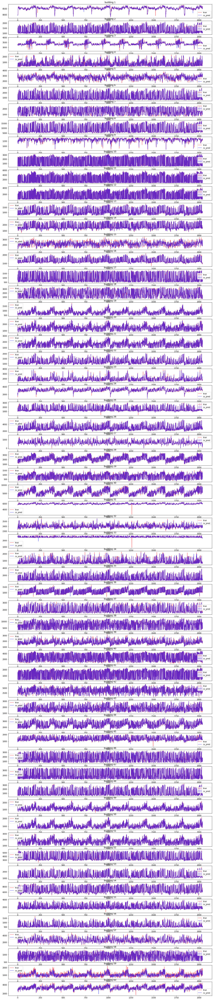

In [30]:
fig = plt.figure(figsize = (20, 100))
for i, (pred, true) in enumerate(zip(cv_preds, cv_trues)):
    plt.subplot(60,1,i+1)
    plt.plot(true, c = 'red', alpha = 0.6, label = 'true')
    plt.plot(pred, c = 'blue', alpha = 0.6, label = 'cv_pred')
    plt.legend()
    plt.title(f'building {i+1}')

In [32]:
sub = np.array(sub)
sub = sub.reshape(-1)
sub.shape

(10080,)

In [33]:
sub_df['answer'] = sub

In [34]:
sub = sub.reshape(60, -1)
sub.shape

(60, 168)

In [35]:
y_trains
y_train = np.array(y_trains).reshape(60, -1)
y_train.shape

(60, 2040)

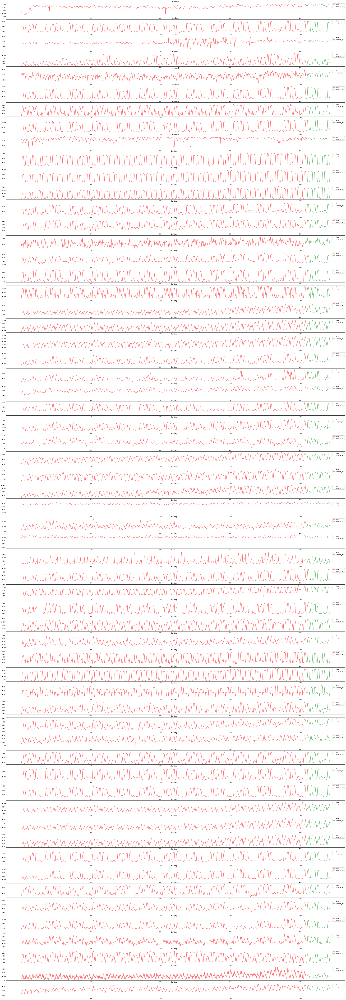

In [36]:
fig = plt.figure(figsize = (50, 150))
for i, (pred, true, test_pred) in enumerate(zip(cv_preds, y_train, sub)):
    plt.subplot(60,1,i+1)
    plt.plot(true, c = 'red', alpha = 0.6, label = 'true')
#     plt.plot(pred, c = 'blue', alpha = 0.6, label = 'cv_pred')
    plt.plot(np.arange(len(pred), len(pred)+168), test_pred, c = 'green', alpha = 0.6, label = 'cv_pred_Test')
    plt.legend()
    plt.title(f'building {i+1}')

In [37]:
sub_df.to_csv('./submission_kfold_xgb_fold10_1.36909393587615.csv', index=False)